In [3]:
%pip install parquet
%pip install pyarrow
%pip install pandas
import pandas as pd
import numpy as np
from sklearn.preprocessing import StandardScaler
import matplotlib.pyplot as plt
import pyarrow.parquet as pq
import os
import joblib
import numpy as np
import time
import matplotlib.pyplot as plt

Note: you may need to restart the kernel to use updated packages.
Note: you may need to restart the kernel to use updated packages.
Note: you may need to restart the kernel to use updated packages.


## Load and pre-process data

In [77]:
# Load data from parquet file  
props = ('G', 'S', 'U', 'H', 'A', 'rho', 'Cp', 'alpha') #, 'Kt', 'Kp', 'Ks', 'alpha', 'vel', 'mus', 'muw', 'Vm', 'Cpm', 'Cpa', 'Va', 'Vex', 'phi', 'aw', 'gam', 'Gex')

# Define directory for G data  
dirG = os.path.join('/Users/ulajones/Documents/School/ESS/ESS569F24/data/ai_ready/', 'G')
os.makedirs(dirG, exist_ok=True)
dfG = pq.read_table(os.path.join(dirG, 'NaCl_G.parquet')).to_pandas()

# Initialize data_j with headers
data_j = pd.DataFrame(columns=['P_Mpa', 'T_K', 'm_molkg'] + list(props))

# Add G data to data_j
data_j['P_Mpa'] = dfG['P_Mpa']
data_j['T_K'] = dfG['T_K']
data_j['m_molkg'] = dfG['m_molkg']

# then add everything else 
for j in props: 
    dir_ready = os.path.join('/Users/ulajones/Documents/School/ESS/ESS569F24/data/ai_ready/', j)
    os.makedirs(dir_ready, exist_ok=True)
    df = pq.read_table(os.path.join(dir_ready, f'NaCl_{j}.parquet')).to_pandas()
    
    data_j[f'{j}'] = df[f'{j}']

# Display the shape, first few rows of the structure to verify
print("Full DataFrame shape:", data_j.shape)
print(data_j.head())

Full DataFrame shape: (939401, 11)
   P_Mpa    T_K  m_molkg             G           S              U  \
0    0.1  240.0      0.0  -8926.550362 -582.447446 -148816.097810   
1   10.1  240.0      0.0   1243.813309 -565.772512 -144768.598346   
2   20.1  240.0      0.0  11326.998932 -552.246594 -141395.802828   
3   30.1  240.0      0.0  21328.899131 -541.372011 -138589.316172   
4   40.1  240.0      0.0  31254.927198 -532.721316 -136256.214314   

               H            A          rho           Cp     alpha  
0 -148713.937389 -9028.710783   978.852659  5300.978960 -0.001804  
1 -134541.589582 -8983.195455   987.581045  4987.894841 -0.001482  
2 -121212.183512 -8856.620385   995.857070  4744.177162 -0.001207  
3 -108600.383619 -8660.033422  1003.703615  4552.559071 -0.000973  
4  -96598.188562 -8403.098554  1011.144636  4399.396981 -0.000775  


## Model Architecture Exploration

My goal is to train a number of neural network architecture using keras and tensorflow; as a start, I will use the keras_tuner module to see which model architecture it identifies as best.  

In [43]:
#first do additional necessary imports
!pip install keras-tuner
!pip install tensorflow
from sklearn import preprocessing
from sklearn.model_selection import train_test_split
from sklearn.metrics import r2_score, mean_squared_error
from tensorflow import keras
from tensorflow.keras import layers
import keras_tuner as kt
from tensorflow.keras.callbacks import EarlyStopping
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
import time
from seafreeze import seafreeze as sf


Again, I am starting by training a simple Keras sequential model just on the Gibbs energy data and tuning hyperparameters. Eventually I would like to be able to handle multiple outputs.

In [44]:
X = data_j[['P_Mpa', 'T_K', 'm_molkg']]
y = data_j['G'].to_numpy().reshape(-1, 1) 

# Normalize the target variable (MSE looks awful without this)
scaler = preprocessing.StandardScaler().fit(y)
y = scaler.transform(y)
y = pd.DataFrame(y, columns=['G'])

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2)

def build_model(hp):
    model = keras.Sequential()
    model.add(layers.InputLayer(input_shape=(X_train.shape[1],)))
    
    # Tune number of layers
    for i in range(hp.Int('num_layers', 1, 3)):
        model.add(layers.Dense(units=hp.Int('units_' + str(i),
                                            min_value=32,
                                            max_value=256,
                                            step=32),
                               activation='relu')) # rectified linear unit activation function for hidden layers
    
    model.add(layers.Dense(1))  # Output layer
    
    # Tune the learning rate for the optimizer
    model.compile(
        optimizer=keras.optimizers.Adam(
            hp.Choice('learning_rate', [1e-2, 1e-3, 1e-4])), # limit to 3 choices for computational efficiency
        loss='mean_squared_error', # start with MSE as loss for simplicity
        metrics=['mean_squared_error'])
    
    return model

tuner = kt.RandomSearch(
    build_model,
    objective='val_mean_squared_error',
    max_trials=5,
    executions_per_trial=1,
    directory='/Users/ulajones/Documents/School/ESS/ESS569F24/',
    project_name='keras_tuner_demo'
)

tuner.search(X_train, y_train, epochs=5, validation_split=0.2) # limit to 5 epochs for computational efficiency

# find optimal hyperparameters
best_hps = tuner.get_best_hyperparameters(num_trials=1)[0]
best_model = tuner.get_best_models()[0]

print(f"""
The optimal number of layers is {best_hps.get('num_layers')} and the optimal number of units in each layer is {best_hps.get('units_0')}.
The optimal learning rate for the optimizer is {best_hps.get('learning_rate')}.
""")

Reloading Tuner from /Users/ulajones/Documents/School/ESS/ESS569F24/keras_tuner_demo/tuner0.json

The optimal number of layers is 2 and the optimal number of units in each layer is 192.
The optimal learning rate for the optimizer is 0.001.



/opt/anaconda3/envs/eos_env/lib/python3.9/site-packages/keras/src/layers/core/input_layer.py:27: UserWarning: Argument `input_shape` is deprecated. Use `shape` instead.
  warnings.warn(
/opt/anaconda3/envs/eos_env/lib/python3.9/site-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 14 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Now build the model...

In [45]:
# Build the model with the optimal hyperparameters and train it
model = tuner.hypermodel.build(best_hps)
history = model.fit(X_train, y_train, epochs=5, validation_split=0.2)

# Make predictions on the test set
y_pred = model.predict(X_test)


Epoch 1/5
18788/18788 ━━━━━━━━━━━━━━━━━━━━ 9s 457us/step - loss: 16.0109 - mean_squared_error: 16.0109 - val_loss: 0.0122 - val_mean_squared_error: 0.0122
Epoch 2/5
18788/18788 ━━━━━━━━━━━━━━━━━━━━ 8s 448us/step - loss: 0.0314 - mean_squared_error: 0.0314 - val_loss: 0.0158 - val_mean_squared_error: 0.0158
Epoch 3/5
18788/18788 ━━━━━━━━━━━━━━━━━━━━ 9s 453us/step - loss: 0.0096 - mean_squared_error: 0.0096 - val_loss: 0.0080 - val_mean_squared_error: 0.0080
Epoch 4/5
18788/18788 ━━━━━━━━━━━━━━━━━━━━ 9s 452us/step - loss: 0.0078 - mean_squared_error: 0.0078 - val_loss: 0.0082 - val_mean_squared_error: 0.0082
Epoch 5/5
18788/18788 ━━━━━━━━━━━━━━━━━━━━ 9s 454us/step - loss: 0.0075 - mean_squared_error: 0.0075 - val_loss: 0.0071 - val_mean_squared_error: 0.0071
5872/5872 ━━━━━━━━━━━━━━━━━━━━ 1s 225us/step


And summarize it:

In [46]:
print(best_model.summary())

r2 = r2_score(y_test, y_pred)
mse = mean_squared_error(y_test, y_pred)

print(f'R2 Score: {r2}')
print(f'Mean Squared Error: {mse}')

Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense (Dense)                   │ (None, 192)            │           768 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 32)             │         6,176 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2 (Dense)                 │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 6,977 (27.25 KB)

 Trainable params: 6,977 (27.25 KB)

 Non-trainable params: 0 (0.00 B)

None
R2 Score: 0.9929258087604602
Mean Squared Error: 0.0070867503200177755


I can get an R2 score of  0.9998568392369517 and an MSE of 0.00014340773795721375 with this method! But now I want to try to build an FNN using a keras functional API that can **predict the variables 'G', 'S', 'U', 'H', 'A', 'rho', and 'Cp' and 'alpha'** from P, T, and M. 

In [47]:
X = data_j[['P_Mpa', 'T_K', 'm_molkg']]
y = data_j[['G', 'S', 'U', 'H', 'A', 'rho', 'Cp', 'alpha']] # add all other properties to target variable

# Normalize the target variable (MSE looks awful without this)
y = pd.DataFrame(y, columns=['G', 'S', 'U', 'H', 'A', 'rho', 'Cp']) # add all other properties to target variable
scaler = preprocessing.StandardScaler().fit(y)
y = scaler.transform(y)

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2)

print(X_train.shape, y_train.shape) # verufy sizes of arrays

(751520, 3) (751520, 7)


Now build the model using an Adam Optimizer Adaptive Moment Estimation algorithm, or a typical stochastic gradient descent method. Will just use MSE as a loss function for now. 

In [48]:
def build_model(hp):
    inputs = keras.Input(shape=(X_train.shape[1],))
    x = inputs
    
    # Tune the number of layers
    for i in range(hp.Int('num_layers', 1, 3)):
        x = layers.Dense(units=hp.Int('units_' + str(i),
                                      min_value=32,
                                      max_value=256,
                                      step=32),
                         activation='relu')(x)
    
    outputs = layers.Dense(y_train.shape[1])(x)  # Output layer for multiple targets
    
    model = keras.Model(inputs, outputs)
    
    # Tune the learning rate for the optimizer
    model.compile(
        optimizer=keras.optimizers.Adam(  
            hp.Choice('learning_rate', [1e-2, 1e-3, 1e-4])),
        loss='mean_squared_error',
        metrics=['mean_squared_error'])
    
    return model

tuner = kt.RandomSearch(
    build_model,
    objective='val_mean_squared_error',
    max_trials=10,   # limit this to 10 for computational time reasons
    executions_per_trial=1,   
    directory='my_dir',
    project_name='keras_tuner_demo'
)

tuner.search(X_train, y_train, epochs=5, validation_split=0.2)   

# Get optimal hyperparameters
best_hps = tuner.get_best_hyperparameters(num_trials=1)[0]

print(f"""
The optimal number of layers is {best_hps.get('num_layers')} and the optimal number of units in each layer is {best_hps.get('units_0')}.
The optimal learning rate for the optimizer is {best_hps.get('learning_rate')}.
""")

# now build  model with the optimal hyperparameters and train it with early stopping
model = tuner.hypermodel.build(best_hps)
early_stopping = EarlyStopping(monitor='val_loss', patience=3) #again needed for memory/ time reasons 

history = model.fit(X_train, y_train, epochs=5, validation_split=0.2, callbacks=[early_stopping]) # limit to 5 epochs for computational efficiency


Reloading Tuner from my_dir/keras_tuner_demo/tuner0.json

The optimal number of layers is 3 and the optimal number of units in each layer is 128.
The optimal learning rate for the optimizer is 0.001.

Epoch 1/5
18788/18788 ━━━━━━━━━━━━━━━━━━━━ 11s 539us/step - loss: 4.7256 - mean_squared_error: 4.7256 - val_loss: 0.0077 - val_mean_squared_error: 0.0077
Epoch 2/5
18788/18788 ━━━━━━━━━━━━━━━━━━━━ 10s 534us/step - loss: 0.0084 - mean_squared_error: 0.0084 - val_loss: 0.0029 - val_mean_squared_error: 0.0029
Epoch 3/5
18788/18788 ━━━━━━━━━━━━━━━━━━━━ 10s 546us/step - loss: 0.0027 - mean_squared_error: 0.0027 - val_loss: 0.0022 - val_mean_squared_error: 0.0022
Epoch 4/5
18788/18788 ━━━━━━━━━━━━━━━━━━━━ 10s 536us/step - loss: 0.0017 - mean_squared_error: 0.0017 - val_loss: 0.0013 - val_mean_squared_error: 0.0013
Epoch 5/5
18788/18788 ━━━━━━━━━━━━━━━━━━━━ 10s 524us/step - loss: 0.0012 - mean_squared_error: 0.0012 - val_loss: 5.4516e-04 - val_mean_squared_error: 5.4516e-04


Reloading Tuner from keras_api/eos/tuner0.json

The optimal number of layers is 10 and the optimal number of units in each layer is 224.
The optimal learning rate for the optimizer is 0.001.

Epoch 1/5
18788/18788 ━━━━━━━━━━━━━━━━━━━━ 46s 2ms/step - loss: 0.0734 - mean_squared_error: 0.0734 - val_loss: 0.0013 - val_mean_squared_error: 0.0013
Epoch 2/5
18788/18788 ━━━━━━━━━━━━━━━━━━━━ 44s 2ms/step - loss: 0.0021 - mean_squared_error: 0.0021 - val_loss: 6.0953e-04 - val_mean_squared_error: 6.0953e-04
Epoch 3/5
18788/18788 ━━━━━━━━━━━━━━━━━━━━ 45s 2ms/step - loss: 0.0013 - mean_squared_error: 0.0013 - val_loss: 6.7068e-04 - val_mean_squared_error: 6.7068e-04
Epoch 4/5
18788/18788 ━━━━━━━━━━━━━━━━━━━━ 44s 2ms/step - loss: 0.0010 - mean_squared_error: 0.0010 - val_loss: 6.7978e-04 - val_mean_squared_error: 6.7978e-04
Epoch 5/5
18788/18788 ━━━━━━━━━━━━━━━━━━━━ 44s 2ms/step - loss: 9.1444e-04 - mean_squared_error: 9.1444e-04 - val_loss: 7.7506e-04 - val_mean_squared_error: 7.7506e-04


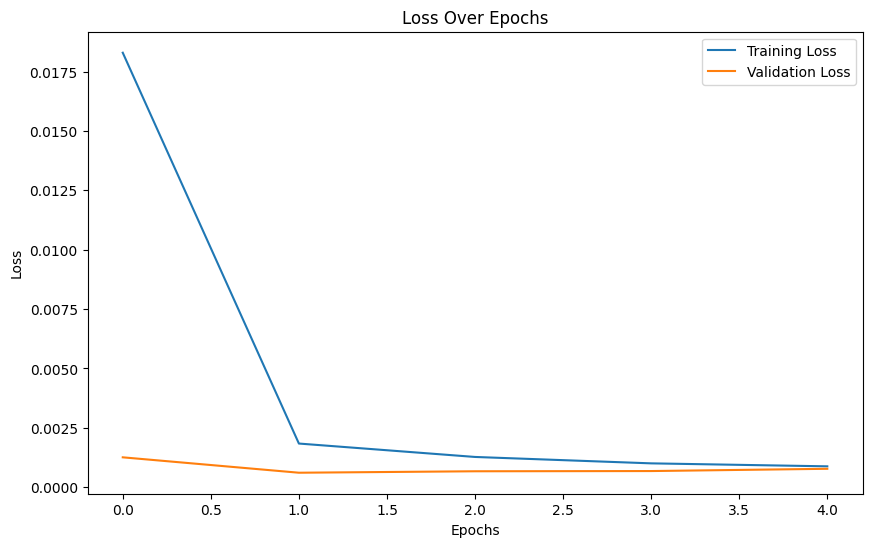

In [49]:
#plotting loss over epochs 

def build_model(hp):
    inputs = keras.Input(shape=(X_train.shape[1],))
    x = inputs
    
    # Tune the number of layers
    for i in range(hp.Int('num_layers', 1, 20)):
        x = layers.Dense(units=hp.Int('units_' + str(i),
                                      min_value=32,
                                      max_value=256,
                                      step=32),
                         activation='relu')(x)
    
    outputs = layers.Dense(y_train.shape[1])(x)  # Output layer for multiple targets
    
    model = keras.Model(inputs, outputs)
    
    # Tune the learning rate for the optimizer
    model.compile(
        optimizer=keras.optimizers.Adam(
            hp.Choice('learning_rate', [1e-2, 1e-3, 1e-4])),
        loss='mean_squared_error',
        metrics=['mean_squared_error'])
    
    return model

tuner = kt.RandomSearch(
    build_model,
    objective='val_mean_squared_error',
    max_trials=10,  # Reduced number of trials
    executions_per_trial=1,  # Reduced executions per trial
    directory='keras_api',
    project_name='eos'
)

tuner.search(X_train, y_train, epochs=10, validation_split=0.2)   

# Get the optimal hyperparameters
best_hps = tuner.get_best_hyperparameters(num_trials=1)[0]

print(f"""
The optimal number of layers is {best_hps.get('num_layers')} and the optimal number of units in each layer is {best_hps.get('units_0')}.
The optimal learning rate for the optimizer is {best_hps.get('learning_rate')}.
""")

# Build the model with the optimal hyperparameters and train it with early stopping
model = tuner.hypermodel.build(best_hps)
early_stopping = EarlyStopping(monitor='val_loss', patience=3)

history = model.fit(X_train, y_train, epochs=5, validation_split=0.2, callbacks=[early_stopping])

# Plot loss over epochs
plt.figure(figsize=(10, 6))
plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.title('Loss Over Epochs')
plt.legend()
plt.show()

In [50]:
# Make predictions on the test set
y_pred = model.predict(X_test)

# Evaluate the model
from sklearn.metrics import r2_score, mean_squared_error

r2 = r2_score(y_test, y_pred, multioutput='uniform_average')
mse = mean_squared_error(y_test, y_pred, multioutput='uniform_average')

print(f'R2 Score: {r2}')
print(f'Mean Squared Error: {mse}')

5872/5872 ━━━━━━━━━━━━━━━━━━━━ 3s 569us/step
R2 Score: 0.9992265606045408
Mean Squared Error: 0.000773293013539102


This looks good. The next cell visualizes the results:

85/85 ━━━━━━━━━━━━━━━━━━━━ 0s 692us/step


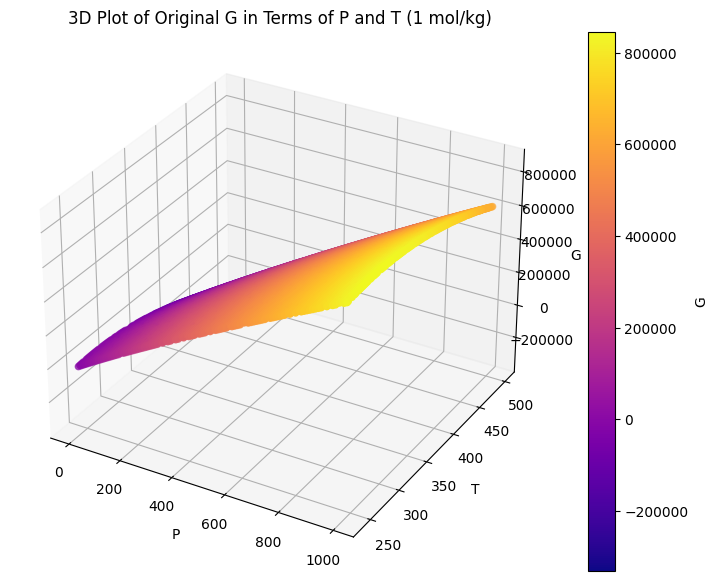

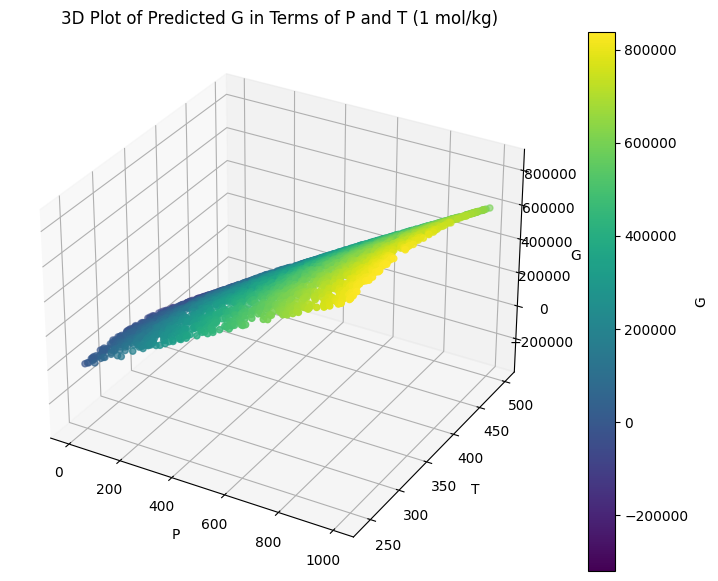

In [51]:
X_train_np = np.array(X_train)

# Filter the training set for a concentration of 1 mol/kg, then get PTM and G
mask_train = X_train_np[:, 2] == 1.0
X_train_filtered = X_train_np[mask_train]
y_train_filtered = y_train[mask_train]
P_train = X_train_filtered[:, 0]
T_train = X_train_filtered[:, 1]
# Undo the normalization  
y_train_original = scaler.inverse_transform(y_train_filtered)
G_train = y_train_original[:, 0]   

# Filter the test set for a concentration of 1 mol/kg; get PTM and rthen make predictions
X_test_np = np.array(X_test)
mask_test = X_test_np[:, 2] == 1.0
X_test_filtered = X_test_np[mask_test]
P_test = X_test_filtered[:, 0]
T_test = X_test_filtered[:, 1]
y_pred_scaled = model.predict(X_test_filtered)
# Undo normalization
y_pred = scaler.inverse_transform(y_pred_scaled)
G_pred = y_pred[:, 0]   

# make a 3D plot for the original training data (G vs P and T for the original training data)
fig1 = plt.figure(figsize=(10, 7))
ax1 = fig1.add_subplot(111, projection='3d')
sc_train = ax1.scatter(P_train, T_train, G_train, c=G_train, cmap='plasma', label='Original G')
cbar1 = plt.colorbar(sc_train)
cbar1.set_label('G')
ax1.set_xlabel('P')
ax1.set_ylabel('T')
ax1.set_zlabel('G')
ax1.set_title('3D Plot of Original G in Terms of P and T (1 mol/kg)')

plt.show()

# make 3D plot for the predicted data
fig2 = plt.figure(figsize=(10, 7))
ax2 = fig2.add_subplot(111, projection='3d')
sc_pred = ax2.scatter(P_test, T_test, G_pred, c=G_pred, cmap='viridis', label='Predicted G')
cbar2 = plt.colorbar(sc_pred)
cbar2.set_label('G')
ax2.set_xlabel('P')
ax2.set_ylabel('T')
ax2.set_zlabel('G')
ax2.set_title('3D Plot of Predicted G in Terms of P and T (1 mol/kg)')

plt.show()

## Model Benchmarking Against CML

Great! It looks like we can pretty quickly evaluate this model for Gibbs energies that are very very similar to the values computed by SeaFreeze. Now I want to see how long it takes the model to evaluate every target variable over the whole combined test and training dataset (the original PTM space), and compare that to doing the original calculation with SeaFreeze...



In [52]:
# recombine training and test sets and make predictions on combined set
X_combined = np.concatenate((X_train, X_test), axis=0)
y_combined = np.concatenate((y_train, y_test), axis=0)
start_time = time.time()
y_pred_scaled_combined = model.predict(X_combined)
end_time = time.time()

# Calculate time taken
time_taken = end_time - start_time
print(f"Time taken to evaluate the model over the combined set: {time_taken:.4f} seconds")



29357/29357 ━━━━━━━━━━━━━━━━━━━━ 17s 585us/step
Time taken to evaluate the model over the combined set: 21.0506 seconds


I want to do this again but for 1000 calculations on individual points. This simulates how a model would use an EoS to calculate thermodynamic parameters point by point.

In [53]:
ptm_pt = np.array([[500, 300, 1.0]], dtype=np.float32)

start_time = time.time()
i=0
while(i<100):
    y_pred_scaled_combined = model.predict(ptm_pt)
    i+=1
end_time = time.time()

# Calculate the time taken
time_taken = end_time - start_time
print(f"Time taken to compute the properties for 100 individual points: {time_taken:.4f} seconds")


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
1/1 ━━━━━━━━

Now I will do the same calculation using SeaFreeze:

In [54]:
ptm_pt = np.empty((1,), object)
ptm_pt[0] = (500, 300, 1.0)

props = ('G', 'S', 'U', 'H', 'A', 'rho', 'Cp')

# Path to the SeaFreeze spline file; other users should define for their system
sf_path = '/Users/ulajones/PycharmProjects/SeaFreeze/Python/seafreeze/SeaFreeze_Gibbs_VII_NaCl.mat'

start_time = time.time()
i=0
while(i<100):
    out = sf.getProp(ptm_pt, 'NaClaq', sf_path, *props) 
    i+=1
end_time = time.time()

# Calculate the time taken
time_taken1 = end_time - start_time
print(f"Time taken to compute the properties using SeaFreeze: {time_taken:.4f} seconds")



Time taken to compute the properties using SeaFreeze: 3.4219 seconds


Time taken to compute the properties using SeaFreeze: 2.0094 seconds
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
1/1 ━━━━━━━━━━━━━━━

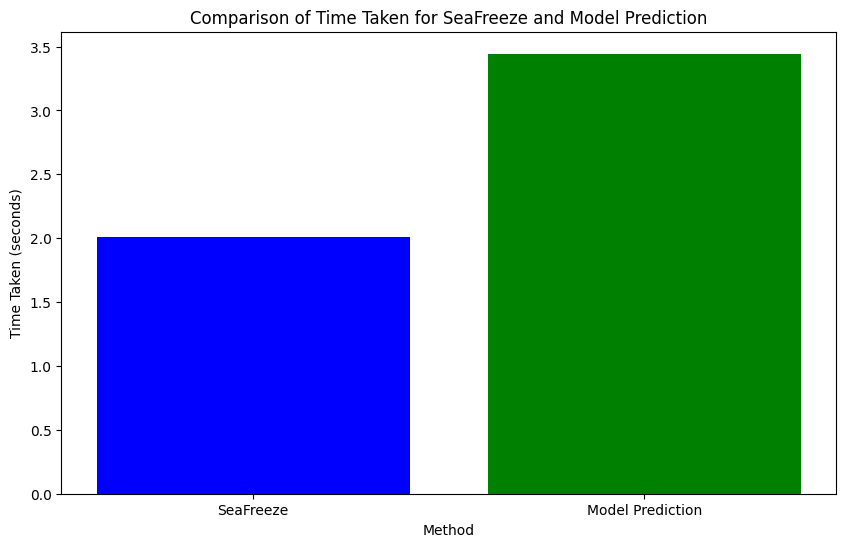

In [55]:
# Define the properties (redundant, but for clarity)
props = ('G', 'S', 'U', 'H', 'A', 'rho', 'Cp')

# Path to the SeaFreeze spline file
sf_path = '/Users/ulajones/PycharmProjects/SeaFreeze/Python/seafreeze/SeaFreeze_Gibbs_VII_NaCl.mat'

# SeaFreeze computation
ptm_pt = np.empty((1,), object)
ptm_pt[0] = (500, 300, 1.0)

start_time = time.time()
i = 0
while i < 100:
    out = sf.getProp(ptm_pt, 'NaClaq', sf_path, *props)
    i += 1
end_time = time.time()

# Calculate the time taken
time_taken1 = end_time - start_time
print(f"Time taken to compute the properties using SeaFreeze: {time_taken1:.4f} seconds")

# make model prediction, record time taken
ptm_pt = np.array([[500, 300, 1.0]], dtype=np.float32)
start_time = time.time()
i = 0
while i < 100:
    y_pred_scaled_combined = model.predict(ptm_pt)
    i += 1
end_time = time.time()

# Calculate time taken
time_taken2 = end_time - start_time
print(f"Time taken to compute the properties for 100 individual points: {time_taken2:.4f} seconds")

# make plot
labels = ['SeaFreeze', 'Model Prediction']
times = [time_taken1, time_taken2]
plt.figure(figsize=(10, 6))
plt.bar(labels, times, color=['blue', 'green'])
plt.xlabel('Method')
plt.ylabel('Time Taken (seconds)')
plt.title('Comparison of Time Taken for SeaFreeze and Model Prediction')
plt.show()

Well, I actually increased the computational time. It's possible deep learning is overkill for this application, so now I'll try benchmarking with previously generated CML models for specific heat, which should be faster. The computational times are plotted below.

/opt/anaconda3/envs/eos_env/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but BaggingRegressor was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/eos_env/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but BaggingRegressor was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/eos_env/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but BaggingRegressor was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/eos_env/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but BaggingRegressor was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/eos_env/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but BaggingRegressor was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/eos_e

Time taken to compute Cp using ExtraTrees: 0.0463 seconds
Time taken to compute Cp using RandomForest: 0.0466 seconds
Time taken to compute Cp using DecisionTree: 0.0420 seconds
Time  to compute 100 specific heat points using SeaFreeze: 2.0316 seconds


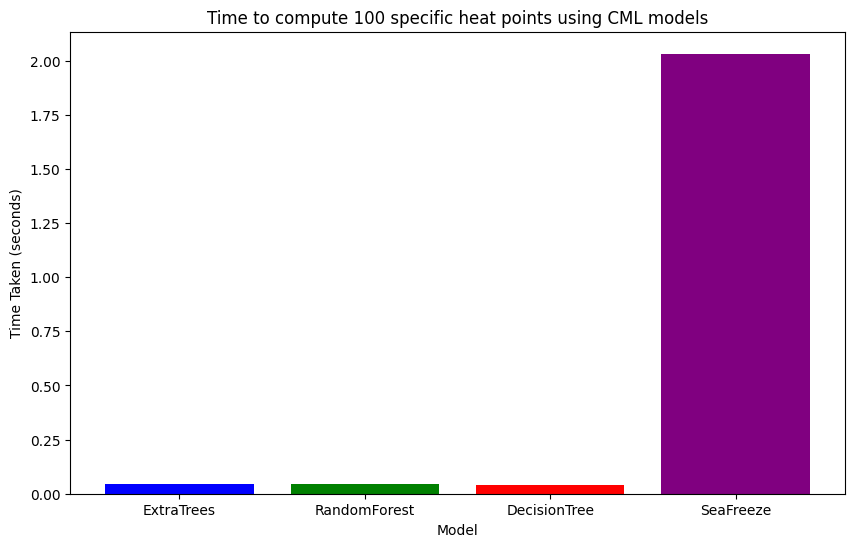

In [56]:
# Load trained models
loaded_models = {
    'ExtraTrees': joblib.load('ExtraTrees_bagging_model.pkl'),
    'RandomForest': joblib.load('RandomForest_bagging_model.pkl'),
    'DecisionTree': joblib.load('DecisionTree_bagging_model.pkl'),
}

# Example data point for prediction
ptm_pt = np.array([[500, 300, 1.0]])   

# Dictionary to store the times taken by each model
times_taken = {}

# Measure the time taken by each model
for name, model in loaded_models.items():
    start_time = time.time()
    for _ in range(100):
        prediction = model.predict(ptm_pt)
    end_time = time.time()
    
    # Calculate the time taken
    time_taken = end_time - start_time
    times_taken[name] = time_taken
    print(f"Time taken to compute Cp using {name}: {time_taken:.4f} seconds")

# Measure the time taken by SeaFreeze
ptm_pt = np.empty((1,), object)
ptm_pt[0] = (500, 300, 1.0)

start_time = time.time()
for _ in range(100):
    out = sf.getProp(ptm_pt, 'NaClaq', sf_path, *props) 
end_time = time.time()

# Calculate and plot the time taken
time_taken = end_time - start_time
times_taken['SeaFreeze'] = time_taken
print(f"Time  to compute 100 specific heat points using SeaFreeze: {time_taken:.4f} seconds")

plt.figure(figsize=(10, 6))
plt.bar(times_taken.keys(), times_taken.values(), color=['blue', 'green', 'red', 'purple', 'orange'])
plt.xlabel('Model')
plt.ylabel('Time Taken (seconds)')
plt.title('Time to compute 100 specific heat points using CML models')
plt.show()

RandomForest achieves up to a 46-fold reduction in computational time. Plot surfaces comparing the original EoS and CML predictions:

/opt/anaconda3/envs/eos_env/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but BaggingRegressor was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/eos_env/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but BaggingRegressor was fitted with feature names
  warnings.warn(
/opt/anaconda3/envs/eos_env/lib/python3.9/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but BaggingRegressor was fitted with feature names
  warnings.warn(


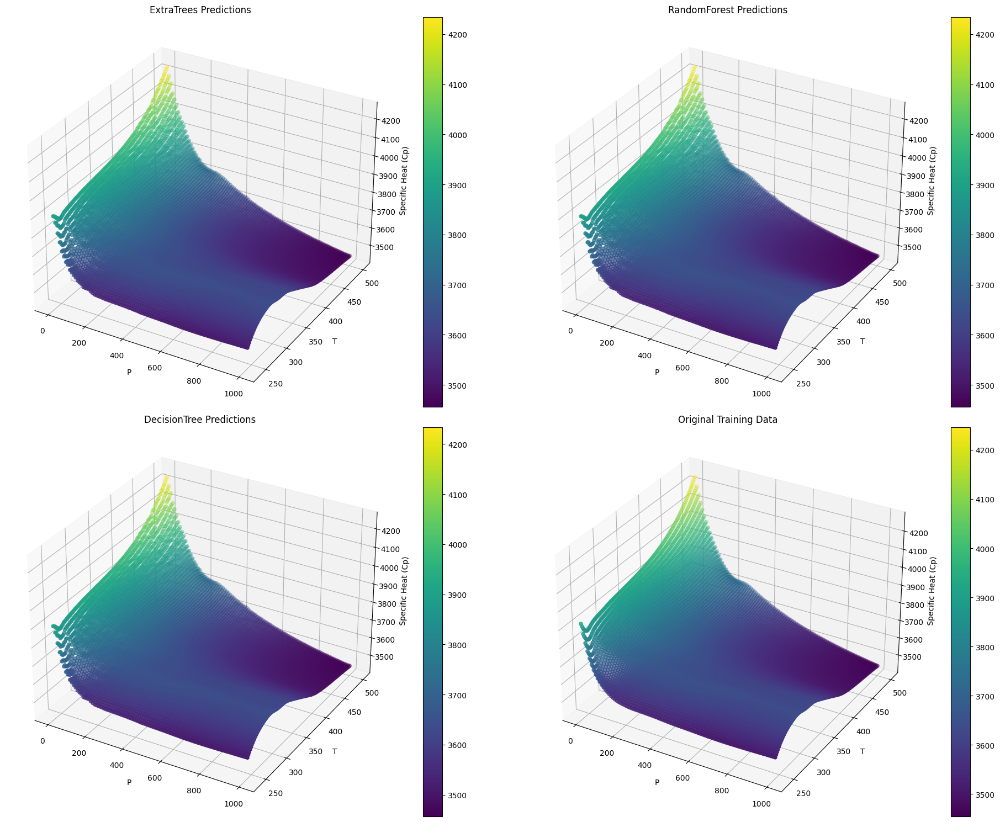

In [57]:
# Filter the data again for a molality of 1 mol/kg
X_filtered = data_j[['P_Mpa', 'T_K', 'm_molkg']].values
y_filtered = data_j['Cp'].values

# Fit the scaler for y_filtered
scaler_y = StandardScaler()
y_filtered_scaled = scaler_y.fit_transform(y_filtered.reshape(-1, 1)).flatten()

# Undo the normalization for the original training data
y_filtered_original = scaler_y.inverse_transform(y_filtered_scaled.reshape(-1, 1)).flatten()

# Make predictions using each model
predictions = {}
 
for name, model in loaded_models.items():
    y_pred_scaled = model.predict(X_filtered)
    y_pred = scaler_y.inverse_transform(y_pred_scaled.reshape(-1, 1)).flatten()
    predictions[name] = y_pred


# Filter the data for a molality of 1 mol/kg, get corresponding P and T
mask = data_j['m_molkg'] == 1.0
P_filtered = X_filtered[mask, 0]
T_filtered = X_filtered[mask, 1] 

# Create 3D plots for each model and the original training data...
fig = plt.figure(figsize=(20, 15))

# Plot for ExtraTrees
ax1 = fig.add_subplot(221, projection='3d')
sc1 = ax1.scatter(P_filtered, T_filtered, predictions['ExtraTrees'][mask], c=predictions['ExtraTrees'][mask], cmap='viridis')
ax1.set_xlabel('P')
ax1.set_ylabel('T')
ax1.set_zlabel('Specific Heat (Cp)')
ax1.set_title('ExtraTrees Predictions')
plt.colorbar(sc1, ax=ax1)

# Plot for RandomForest
ax2 = fig.add_subplot(222, projection='3d')
sc2 = ax2.scatter(P_filtered, T_filtered, predictions['RandomForest'][mask], c=predictions['RandomForest'][mask], cmap='viridis')
ax2.set_xlabel('P')
ax2.set_ylabel('T')
ax2.set_zlabel('Specific Heat (Cp)')
ax2.set_title('RandomForest Predictions')
plt.colorbar(sc2, ax=ax2)

# Plot for DecisionTree
ax3 = fig.add_subplot(223, projection='3d')
sc3 = ax3.scatter(P_filtered, T_filtered, predictions['DecisionTree'][mask], c=predictions['DecisionTree'][mask], cmap='viridis')
ax3.set_xlabel('P')
ax3.set_ylabel('T')
ax3.set_zlabel('Specific Heat (Cp)')
ax3.set_title('DecisionTree Predictions')
plt.colorbar(sc3, ax=ax3)

# Plot for Original Training Data
ax5 = fig.add_subplot(224, projection='3d')
sc5 = ax5.scatter(P_filtered, T_filtered, y_filtered_original[mask], c=y_filtered_original[mask], cmap='viridis')
ax5.set_xlabel('P')
ax5.set_ylabel('T')
ax5.set_zlabel('Specific Heat (Cp)')
ax5.set_title('Original Training Data')
plt.colorbar(sc5, ax=ax5)

plt.tight_layout()
plt.show()


They look good. 

Now that I've determined a CML approach is actually best after all, I want to quickly try to train a multi-target regression model to predict all the target variables in props from P, T, and M. I will use random forest as the base regressor as it was just shown to achieve the best computational times.

In [88]:
#imports...

from sklearn.multioutput import MultiOutputRegressor
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import RandomizedSearchCV
from sklearn.multioutput import MultiOutputRegressor
from sklearn.ensemble import RandomForestRegressor
from sklearn.decomposition import PCA
from sklearn.metrics import mean_squared_error, r2_score

In [58]:
# put all tdvs back in the target variable...

# Display the shape, first few rows of the structure to verify
print("Full DataFrame shape:", data_j.shape)
print(data_j.head())

# Extract features and target variables
X = data_j[['P_Mpa', 'T_K', 'm_molkg']].values
y = data_j[list(props)].values

Full DataFrame shape: (939401, 11)
   P_Mpa    T_K  m_molkg             G           S              U  \
0    0.1  240.0      0.0  -8926.550362 -582.447446 -148816.097810   
1   10.1  240.0      0.0   1243.813309 -565.772512 -144768.598346   
2   20.1  240.0      0.0  11326.998932 -552.246594 -141395.802828   
3   30.1  240.0      0.0  21328.899131 -541.372011 -138589.316172   
4   40.1  240.0      0.0  31254.927198 -532.721316 -136256.214314   

               H            A          rho           Cp     alpha  
0 -148713.937389 -9028.710783   978.852659  5300.978960 -0.001804  
1 -134541.589582 -8983.195455   987.581045  4987.894841 -0.001482  
2 -121212.183512 -8856.620385   995.857070  4744.177162 -0.001207  
3 -108600.383619 -8660.033422  1003.703615  4552.559071 -0.000973  
4  -96598.188562 -8403.098554  1011.144636  4399.396981 -0.000775  


In [59]:
# make training and test sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Normalize  features
scaler_X = StandardScaler()
X_train_scaled = scaler_X.fit_transform(X_train)
X_test_scaled = scaler_X.transform(X_test)

# Normalize target variables
scaler_y = StandardScaler()
y_train_scaled = scaler_y.fit_transform(y_train)
y_test_scaled = scaler_y.transform(y_test)

# Initialize the base regressor
base_regressor = RandomForestRegressor(random_state=42)

# Initialize the multi-output regressor
multi_target_regressor = MultiOutputRegressor(base_regressor)

# Train the model
multi_target_regressor.fit(X_train_scaled, y_train_scaled)

# Make predictions
y_pred_scaled = multi_target_regressor.predict(X_test_scaled)

# Inverse transform the predictions
y_pred = scaler_y.inverse_transform(y_pred_scaled)
y_test_original = scaler_y.inverse_transform(y_test_scaled)

# Calculate MSE and R2 for each target variable
mse_scores = mean_squared_error(y_test_original, y_pred, multioutput='raw_values')
r2_scores = r2_score(y_test_original, y_pred, multioutput='raw_values')

# Print the metrics
for i, prop in enumerate(props):
    print(f"{prop} - MSE: {mse_scores[i]:.4f}, R2: {r2_scores[i]:.4f}")

G - MSE: 253874.3466, R2: 1.0000
S - MSE: 1.4002, R2: 1.0000
U - MSE: 68947.4568, R2: 1.0000
H - MSE: 369151.2803, R2: 1.0000
A - MSE: 36526.1491, R2: 1.0000
rho - MSE: 0.2018, R2: 1.0000
Cp - MSE: 1.2753, R2: 1.0000


Ew. the obvious next step is to try pca, but since this has been problematic in the past I will try to improve this via cross validation and hyper parameter tuning first

In [60]:
y = pd.DataFrame(y, columns=['G', 'S', 'U', 'H', 'A', 'rho', 'Cp']) # add all other properties to target variable
scaler = preprocessing.StandardScaler().fit(y)
y = scaler.transform(y)

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2)

print(X_train.shape, y_train.shape) # verufy sizes of arrays
# Normalize  features

scaler_X = StandardScaler()
X_train_scaled = scaler_X.fit_transform(X_train)
X_test_scaled = scaler_X.transform(X_test)

# Normalize the target variables
scaler_y = StandardScaler()
y_train_scaled = scaler_y.fit_transform(y_train)
y_test_scaled = scaler_y.transform(y_test)
# Define the parameter grid for RandomForestRegressor
param_grid = {
    'estimator__n_estimators': [25, 50],
    'estimator__max_depth': [None, 5, 10],
    'estimator__min_samples_split': [2, 5],
    'estimator__min_samples_leaf': [1, 2]
}

# Initialize the base regressor
base_regressor = RandomForestRegressor(random_state=42)

# Initialize the multi-output regressor
multi_target_regressor = MultiOutputRegressor(base_regressor)

# Perform randomized search with cross-validation
random_search = RandomizedSearchCV(multi_target_regressor, param_grid, cv=3, scoring='neg_mean_squared_error', n_iter=10, n_jobs=-1, random_state=42)
random_search.fit(X_train_scaled, y_train_scaled)


(751520, 3) (751520, 7)


/opt/anaconda3/envs/eos_env/lib/python3.9/site-packages/joblib/externals/loky/process_executor.py:752: UserWarning: A worker stopped while some jobs were given to the executor. This can be caused by a too short worker timeout or by a memory leak.
  warnings.warn(


RandomizedSearchCV(cv=3,
                   estimator=MultiOutputRegressor(estimator=RandomForestRegressor(random_state=42)),
                   n_jobs=-1,
                   param_distributions={'estimator__max_depth': [None, 5, 10],
                                        'estimator__min_samples_leaf': [1, 2],
                                        'estimator__min_samples_split': [2, 5],
                                        'estimator__n_estimators': [25, 50]},
                   random_state=42, scoring='neg_mean_squared_error')

In [61]:
# Get the best parameters
best_params = random_search.best_params_
print("Best parameters:", best_params)

# Train the model with the best parameters
best_regressor = RandomForestRegressor(
    n_estimators=best_params['estimator__n_estimators'],
    max_depth=best_params['estimator__max_depth'],
    min_samples_split=best_params['estimator__min_samples_split'],
    min_samples_leaf=best_params['estimator__min_samples_leaf'],
    random_state=42
)
multi_target_regressor = MultiOutputRegressor(best_regressor)
multi_target_regressor.fit(X_train_scaled, y_train_scaled)

# Make predictions
y_pred_scaled = multi_target_regressor.predict(X_test_scaled)

# Inverse transform the predictions
y_pred = scaler_y.inverse_transform(y_pred_scaled)
y_test_original = scaler_y.inverse_transform(y_test_scaled)

# get MSE and R2 for target variables
mse_scores = mean_squared_error(y_test_original, y_pred, multioutput='raw_values')
r2_scores = r2_score(y_test_original, y_pred, multioutput='raw_values')

# print  metrics
for i, prop in enumerate(props):
    print(f"{prop} - MSE: {mse_scores[i]:.4f}, R2: {r2_scores[i]:.4f}")

Best parameters: {'estimator__n_estimators': 50, 'estimator__min_samples_split': 2, 'estimator__min_samples_leaf': 1, 'estimator__max_depth': None}
G - MSE: 0.0000, R2: 1.0000
S - MSE: 0.0000, R2: 1.0000
U - MSE: 0.0000, R2: 1.0000
H - MSE: 0.0000, R2: 1.0000
A - MSE: 0.0000, R2: 1.0000
rho - MSE: 0.0000, R2: 1.0000
Cp - MSE: 0.0000, R2: 1.0000


nice! But how do the computational times measure up? 

Time taken to compute the properties using the multi-output regressor: 0.6027 seconds
Time taken to compute the properties using SeaFreeze: 2.2958 seconds


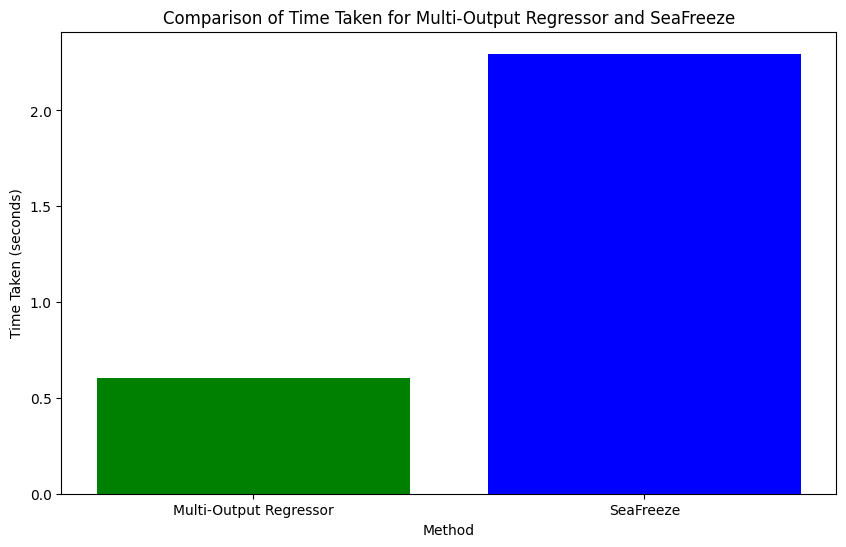

In [62]:
ptm_pt = np.array([[500, 300, 1.0]], dtype=np.float32)

# Measure the time taken by the multi-output regressor
start_time = time.time()
for _ in range(100):
    y_pred_scaled = multi_target_regressor.predict(ptm_pt)
end_time = time.time()

# Calculate the time taken
time_taken_model = end_time - start_time
print(f"Time taken to compute the properties using the multi-output regressor: {time_taken_model:.4f} seconds")

from seafreeze import seafreeze as sf

# Path to the SeaFreeze spline file
sf_path = '/Users/ulajones/PycharmProjects/SeaFreeze/Python/seafreeze/SeaFreeze_Gibbs_VII_NaCl.mat'

# SeaFreeze computation
ptm_pt_seafreeze = np.empty((1,), object)
ptm_pt_seafreeze[0] = (500, 300, 1.0)

# Measure the time taken by SeaFreeze
start_time = time.time()
for _ in range(100):
    out = sf.getProp(ptm_pt_seafreeze, 'NaClaq', sf_path, *props)
end_time = time.time()

# Calculate the time taken
time_taken_seafreeze = end_time - start_time
print(f"Time taken to compute the properties using SeaFreeze: {time_taken_seafreeze:.4f} seconds")

labels = ['Multi-Output Regressor', 'SeaFreeze']
times = [time_taken_model, time_taken_seafreeze]

plt.figure(figsize=(10, 6))
plt.bar(labels, times, color=['green', 'blue'])
plt.xlabel('Method')
plt.ylabel('Time Taken (seconds)')
plt.title('Comparison of Time Taken for Multi-Output Regressor and SeaFreeze')
plt.show()

Roughly a fourfold increase. Just to visualize properties… 

MSE: [0.11771951], R²: [0.99999132]


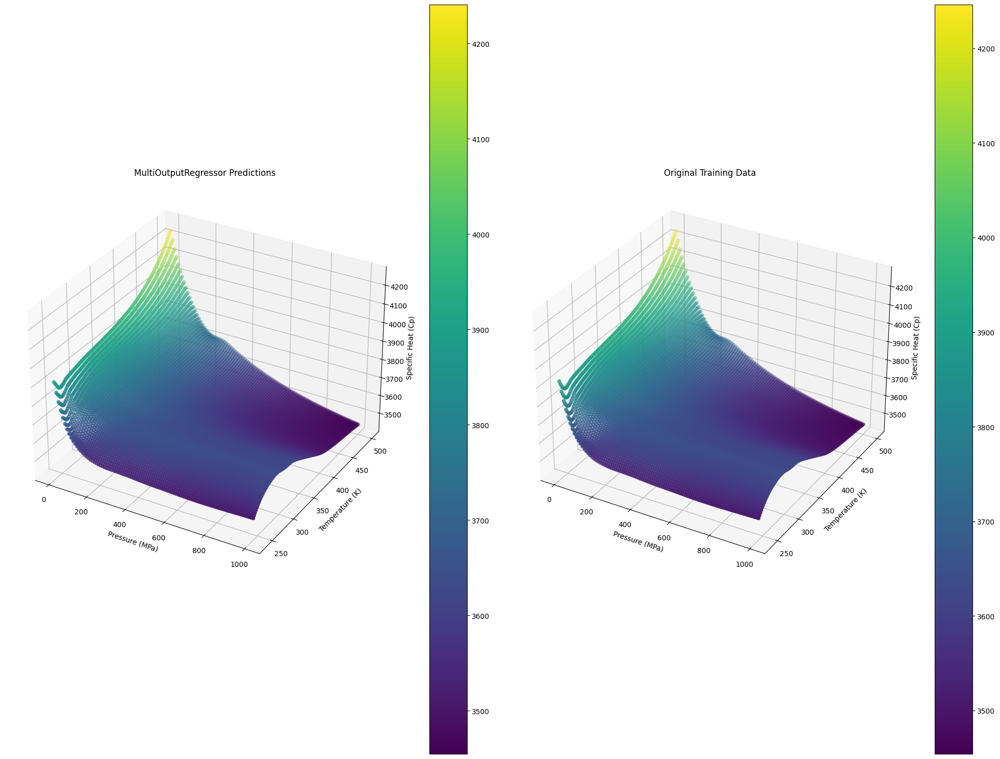

In [94]:
# Filter and mask the data for a molality of 1 mol/kg
mask = data_j['m_molkg'] == 1.0
data_filtered = data_j[mask]

# Extract features and target variables
X_filtered = data_filtered[['P_Mpa', 'T_K', 'm_molkg']].values
y_filtered = data_filtered[['Cp']].values  # Specific heat (Cp) as the target variable

# Normalize the features
scaler_X = StandardScaler()
X_filtered_scaled = scaler_X.fit_transform(X_filtered)

# Normalize the target variable
scaler_y = StandardScaler()
y_filtered_scaled = scaler_y.fit_transform(y_filtered)

# Initialize the base regressor
base_regressor = RandomForestRegressor(random_state=42)

# Initialize the multi-output regressor
multi_target_regressor = MultiOutputRegressor(base_regressor)

# Train the model
multi_target_regressor.fit(X_filtered_scaled, y_filtered_scaled)

# Make predictions
y_pred_scaled = multi_target_regressor.predict(X_filtered_scaled)

# Inverse transform the predictions
y_pred = scaler_y.inverse_transform(y_pred_scaled)

# Calculate/print MSE and R² for each target variable
mse_scores = mean_squared_error(y_filtered, y_pred, multioutput='raw_values')
r2_scores = r2_score(y_filtered, y_pred, multioutput='raw_values')
print(f"MSE for Cp: {mse_scores}, R² for Cp: {r2_scores}")

# Extract P and T values
P_filtered = X_filtered[:, 0]
T_filtered = X_filtered[:, 1]

# Create 3D plots for the predictions and the original training data
fig = plt.figure(figsize=(20, 15))

# Plot for MultiOutputRegressor Predictions
ax1 = fig.add_subplot(121, projection='3d')
sc1 = ax1.scatter(P_filtered, T_filtered, y_pred, c=y_pred, cmap='viridis')
ax1.set_xlabel('Pressure (MPa)')
ax1.set_ylabel('Temperature (K)')
ax1.set_zlabel('Specific Heat (Cp)')
ax1.set_title('MultiOutputRegressor Predictions')
plt.colorbar(sc1, ax=ax1)

# Plot for Original Training Data
ax2 = fig.add_subplot(122, projection='3d')
sc2 = ax2.scatter(P_filtered, T_filtered, y_filtered, c=y_filtered, cmap='viridis')
ax2.set_xlabel('Pressure (MPa)')
ax2.set_ylabel('Temperature (K)')
ax2.set_zlabel('Specific Heat (Cp)')
ax2.set_title('Original Training Data')
plt.colorbar(sc2, ax=ax2)

plt.tight_layout()
plt.show()

MSE for S: [0.11771951], R² for S: [0.99999132]


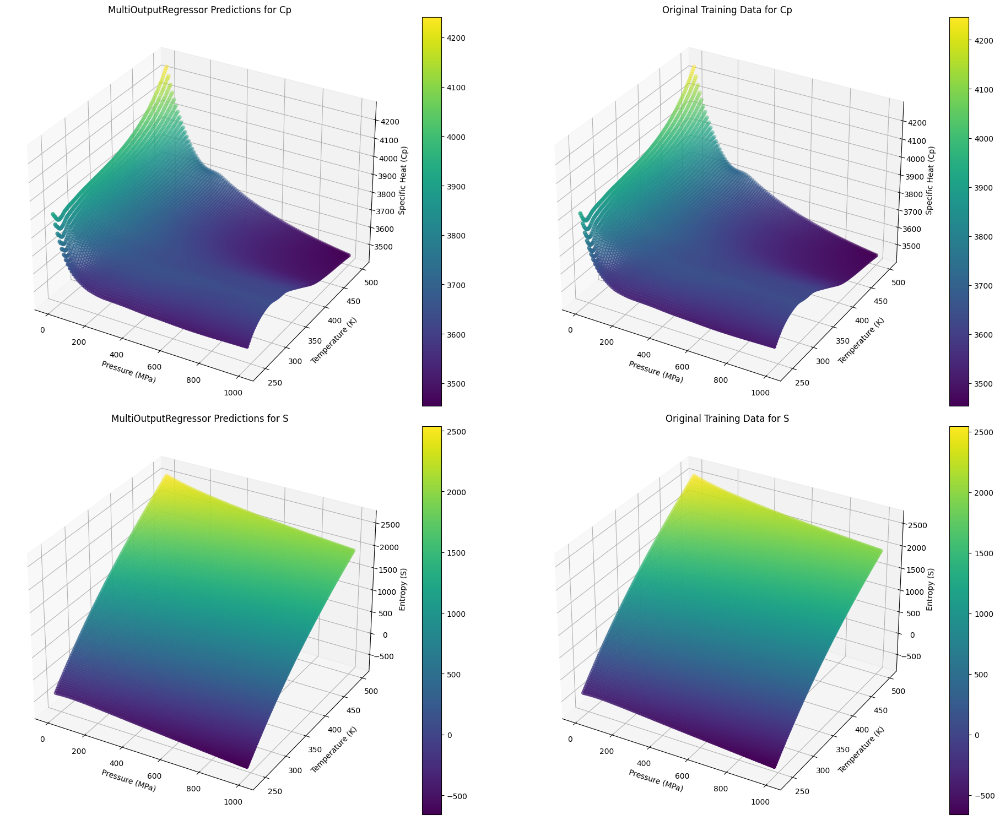

In [98]:
# get filtered features and values for Cp
X_filtered = data_filtered[['P_Mpa', 'T_K', 'm_molkg']].values
y_filtered_cp = data_filtered[['Cp']].values  # Specific heat (Cp) as the target variable

# Normalize the features
scaler_X = StandardScaler()
X_filtered_scaled = scaler_X.fit_transform(X_filtered)

# Normalize the target variable for Cp
scaler_y_cp = StandardScaler()
y_filtered_scaled_cp = scaler_y_cp.fit_transform(y_filtered_cp)

# Initialize the base regressor
base_regressor = RandomForestRegressor(random_state=42)

# Initialize the multi-output regressor for Cp
multi_target_regressor_cp = MultiOutputRegressor(base_regressor)

# Train the model for Cp
multi_target_regressor_cp.fit(X_filtered_scaled, y_filtered_scaled_cp)

# Make predictions for Cp
y_pred_scaled_cp = multi_target_regressor_cp.predict(X_filtered_scaled)

# Inverse transform the predictions for Cp
y_pred_cp = scaler_y_cp.inverse_transform(y_pred_scaled_cp)

# Extract target variables for S
y_filtered_s = data_filtered[['S']].values  # Entropy (S) as the target variable

# Normalize the target variable for S
scaler_y_s = StandardScaler()
y_filtered_scaled_s = scaler_y_s.fit_transform(y_filtered_s)

# Initialize the multi-output regressor for S
multi_target_regressor_s = MultiOutputRegressor(base_regressor)

# Train the model for S
multi_target_regressor_s.fit(X_filtered_scaled, y_filtered_scaled_s)

# Make predictions for S
y_pred_scaled_s = multi_target_regressor_s.predict(X_filtered_scaled)

# Inverse transform the predictions for S
y_pred_s = scaler_y_s.inverse_transform(y_pred_scaled_s)

# Calculate MSE and R² for S
mse_scores_S = mean_squared_error(y_filtered, y_pred_s, multioutput='raw_values')
r2_scores_S = r2_score(y_filtered, y_pred_s, multioutput='raw_values')
print(f"MSE for S: {mse_scores}, R² for S: {r2_scores}")


# Extract P and T values
P_filtered = X_filtered[:, 0]
T_filtered = X_filtered[:, 1]

# Create 3D plots for the predictions and the original training data for Cp
fig = plt.figure(figsize=(20, 15))

# Plot for MultiOutputRegressor Predictions for Cp
ax1 = fig.add_subplot(221, projection='3d')
sc1 = ax1.scatter(P_filtered, T_filtered, y_pred_cp, c=y_pred_cp, cmap='viridis')
ax1.set_xlabel('Pressure (MPa)')
ax1.set_ylabel('Temperature (K)')
ax1.set_zlabel('Specific Heat (Cp)')
ax1.set_title('MultiOutputRegressor Predictions for Cp')
plt.colorbar(sc1, ax=ax1)

# Plot for Original Training Data for Cp
ax2 = fig.add_subplot(222, projection='3d')
sc2 = ax2.scatter(P_filtered, T_filtered, y_filtered_cp, c=y_filtered_cp, cmap='viridis')
ax2.set_xlabel('Pressure (MPa)')
ax2.set_ylabel('Temperature (K)')
ax2.set_zlabel('Specific Heat (Cp)')
ax2.set_title('Original Training Data for Cp')
plt.colorbar(sc2, ax=ax2)

# Create 3D plots for the predictions and the original training data for S
# Plot for MultiOutputRegressor Predictions for S
ax3 = fig.add_subplot(223, projection='3d')
sc3 = ax3.scatter(P_filtered, T_filtered, y_pred_s, c=y_pred_s, cmap='viridis')
ax3.set_xlabel('Pressure (MPa)')
ax3.set_ylabel('Temperature (K)')
ax3.set_zlabel('Entropy (S)')
ax3.set_title('MultiOutputRegressor Predictions for S')
plt.colorbar(sc3, ax=ax3)

# Plot for Original Training Data for S
ax4 = fig.add_subplot(224, projection='3d')
sc4 = ax4.scatter(P_filtered, T_filtered, y_filtered_s, c=y_filtered_s, cmap='viridis')
ax4.set_xlabel('Pressure (MPa)')
ax4.set_ylabel('Temperature (K)')
ax4.set_zlabel('Entropy (S)')
ax4.set_title('Original Training Data for S')
plt.colorbar(sc4, ax=ax4)

plt.tight_layout()
plt.show()

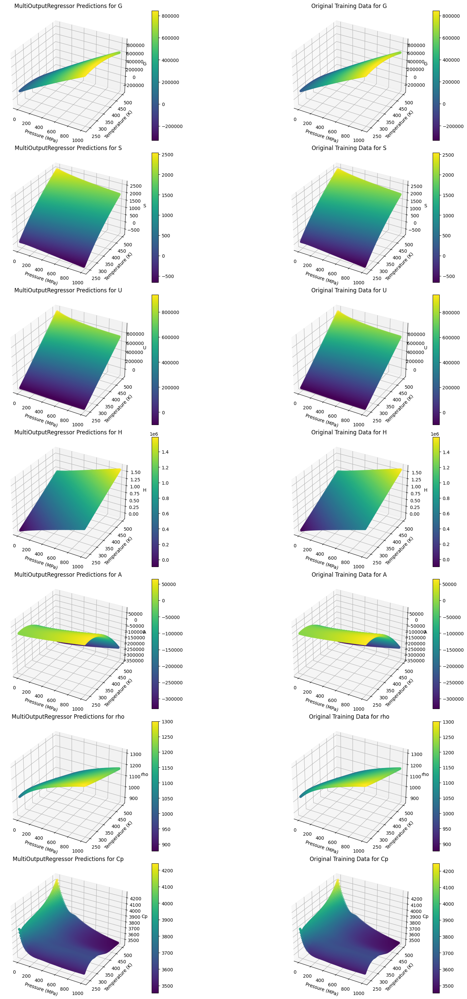

G - MSE: 174378.6346, R²: 1.0000
S - MSE: 0.6261, R²: 1.0000
U - MSE: 55096.1876, R²: 1.0000
H - MSE: 498666.1379, R²: 1.0000
A - MSE: 14294.0206, R²: 1.0000
rho - MSE: 0.0262, R²: 1.0000
Cp - MSE: 0.1177, R²: 1.0000


In [101]:
# Initialize the base regressor
base_regressor = RandomForestRegressor(random_state=42)

# initialize the multi-output regressor
multi_target_regressor = MultiOutputRegressor(base_regressor)

# Extract P and T values
P_filtered = X_filtered[:, 0]
T_filtered = X_filtered[:, 1]

# Define the target variables
target_vars = ['G', 'S', 'U', 'H', 'A', 'rho', 'Cp']

mse_scores = []
r2_scores = []

# Create 3D plots for each target variable
fig = plt.figure(figsize=(20, 30))

for i, target in enumerate(target_vars):
    # Extract target variable
    y_filtered = data_filtered[[target]].values

    # Normalize the target variable
    scaler_y = StandardScaler()
    y_filtered_scaled = scaler_y.fit_transform(y_filtered)

    # Train the model
    multi_target_regressor.fit(X_filtered_scaled, y_filtered_scaled)

    # Make predictions
    y_pred_scaled = multi_target_regressor.predict(X_filtered_scaled)

    # Inverse transform the predictions
    y_pred = scaler_y.inverse_transform(y_pred_scaled)

    # Calculate MSE and R² for each target variable
    mse = mean_squared_error(y_filtered, y_pred)
    r2 = r2_score(y_filtered, y_pred)
    mse_scores.append(mse)
    r2_scores.append(r2)

    # Create 3D plot for the predictions
    ax1 = fig.add_subplot(len(target_vars), 2, 2*i+1, projection='3d')
    sc1 = ax1.scatter(P_filtered, T_filtered, y_pred, c=y_pred, cmap='viridis')
    ax1.set_xlabel('Pressure (MPa)')
    ax1.set_ylabel('Temperature (K)')
    ax1.set_zlabel(target)
    ax1.set_title(f'MultiOutputRegressor Predictions for {target}')
    plt.colorbar(sc1, ax=ax1)

    # Create 3D plot for the original training data
    ax2 = fig.add_subplot(len(target_vars), 2, 2*i+2, projection='3d')
    sc2 = ax2.scatter(P_filtered, T_filtered, y_filtered, c=y_filtered, cmap='viridis')
    ax2.set_xlabel('Pressure (MPa)')
    ax2.set_ylabel('Temperature (K)')
    ax2.set_zlabel(target)
    ax2.set_title(f'Original Training Data for {target}')
    plt.colorbar(sc2, ax=ax2)

plt.tight_layout()
plt.show()

# Print the metrics
for i, prop in enumerate(target_vars):
    print(f"{prop} - MSE: {mse_scores[i]:.4f}, R²: {r2_scores[i]:.4f}")


Well, this could be better for some of the internal energies, but for the properties that matter in modeling it works fine.

Just in case, let's try PCA again...

In [66]:
# Apply PCA on the target variables
pca = PCA(n_components=0.95)  # Retain 95% of the variance
y_train_pca = pca.fit_transform(y_train_scaled)
y_test_pca = pca.transform(y_test_scaled)

# Print the explained variance ratio
print("Explained variance ratio:", pca.explained_variance_ratio_)
print("Number of components:", pca.n_components_)

# Initialize the base regressor
base_regressor = RandomForestRegressor(random_state=42)

# Initialize the multi-output regressor
multi_target_regressor = MultiOutputRegressor(base_regressor)

# Train the model on the PCA-transformed target variables
multi_target_regressor.fit(X_train_scaled, y_train_pca)

# Make predictions on the test set
y_pred_pca = multi_target_regressor.predict(X_test_scaled)

# Inverse transform the PCA components to get the original target variables
y_pred_scaled = pca.inverse_transform(y_pred_pca)
y_test_scaled_original = pca.inverse_transform(y_test_pca)

# Inverse transform the scaled predictions and test data
y_pred = scaler_y.inverse_transform(y_pred_scaled)
y_test_original = scaler_y.inverse_transform(y_test_scaled_original)

# Calculate MSE and R2 for each target variable
mse_scores = mean_squared_error(y_test_original, y_pred, multioutput='raw_values')
r2_scores = r2_score(y_test_original, y_pred, multioutput='raw_values')

# Print the metrics
for i, prop in enumerate(props):
    print(f"{prop} - MSE: {mse_scores[i]:.4f}, R2: {r2_scores[i]:.4f}")

Explained variance ratio: [0.55538389 0.30653066 0.12614062]
Number of components: 3
G - MSE: 0.1407, R2: 1.0000
S - MSE: 0.0407, R2: 1.0000
U - MSE: 0.0422, R2: 1.0000
H - MSE: 0.1153, R2: 1.0000
A - MSE: 0.0377, R2: 1.0000
rho - MSE: 0.1466, R2: 1.0000
Cp - MSE: 0.2701, R2: 1.0000


Maybe I'm doing something wrong? looks no good. let's try an fnn

Model: "sequential_2"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_21 (Dense)                │ (None, 128)            │           512 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_22 (Dense)                │ (None, 64)             │         8,256 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_23 (Dense)                │ (None, 7)              │           455 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 9,223 (36.03 KB)

 Trainable params: 9,223 (36.03 KB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/50
18788/18788 ━━━━━━━━━━━━━━━━━━━━ 9s 461us/step - loss: 0.0102 - mean_squared_error: 0.0102 - val_loss: 1.8913e-04 - val_mean_squared_error: 1.8913e-04
Epoch 2/50
18788/18788 ━━━━━━━━━━━━━━━━━━━━ 9s 458us/step - loss: 2.0967e-04 - mean_squared_error: 2.0967e-04 - val_loss: 1.0541e-04 - val_mean_squared_error: 1.0541e-04
Epoch 3/50
18788/18788 ━━━━━━━━━━━━━━━━━━━━ 9s 462us/step - loss: 1.6152e-04 - mean_squared_error: 1.6152e-04 - val_loss: 8.9732e-05 - val_mean_squared_error: 8.9732e-05
Epoch 4/50
18788/18788 ━━━━━━━━━━━━━━━━━━━━ 9s 468us/step - loss: 1.3879e-04 - mean_squared_error: 1.3879e-04 - val_loss: 1.0609e-04 - val_mean_squared_error: 1.0609e-04
Epoch 5/50
18788/18788 ━━━━━━━━━━━━━━━━━━━━ 9s 471us/step - loss: 1.3530e-04 - mean_squared_error: 1.3530e-04 - val_loss: 6.8713e-05 - val_mean_squared_error: 6.8713e-05
Epoch 6/50
18788/18788 ━━━━━━━━━━━━━━━━━━━━ 9s 458us/step - loss: 1.3195e-04 - mean_squared_error: 1.3195e-04 - val_loss: 1.1292e-04 - val_mean_squared_error:

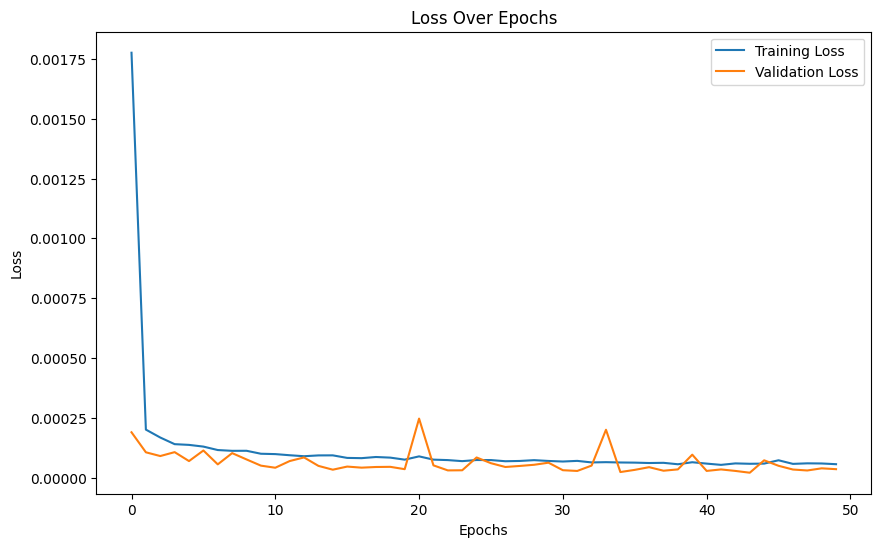

In [67]:
# Normalize the target variable (MSE looks awful without this)

y = pd.DataFrame(y, columns=['G', 'S', 'U', 'H', 'A', 'rho', 'Cp']) # add all other properties to target variable
scaler = preprocessing.StandardScaler().fit(y)
y = scaler.transform(y)

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2)

# Normalize the features
scaler_X = StandardScaler()
X_train_scaled = scaler_X.fit_transform(X_train)
X_test_scaled = scaler_X.transform(X_test)

# Normalize the target variables
scaler_y = StandardScaler()
y_train_scaled = scaler_y.fit_transform(y_train)
y_test_scaled = scaler_y.transform(y_test)

# Define the model
def build_model():
    model = keras.Sequential()
    model.add(layers.Input(shape=(X_train_scaled.shape[1],)))
    model.add(layers.Dense(128, activation='relu'))
    model.add(layers.Dense(64, activation='relu'))
    model.add(layers.Dense(y_train_scaled.shape[1]))  # Output layer for multiple targets
    model.compile(optimizer='adam', loss='mean_squared_error', metrics=['mean_squared_error'])
    return model

model = build_model()
model.summary()

# Train the model
from tensorflow.keras.callbacks import EarlyStopping

# Define early stopping callback
early_stopping = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)

# Train the model
history = model.fit(X_train_scaled, y_train_scaled, epochs=50, validation_split=0.2, callbacks=[early_stopping])

# Evaluate the model on the test set
test_loss, test_mse = model.evaluate(X_test_scaled, y_test_scaled)
print(f"Test MSE: {test_mse:.4f}")

# Make predictions
y_pred_scaled = model.predict(X_test_scaled)

# Inverse transform the predictions
y_pred = scaler_y.inverse_transform(y_pred_scaled)
y_test_original = scaler_y.inverse_transform(y_test_scaled)

# Calculate MSE and R2 for each target variable
mse_scores = mean_squared_error(y_test_original, y_pred, multioutput='raw_values')
r2_scores = r2_score(y_test_original, y_pred, multioutput='raw_values')

# Print the metrics
for i, prop in enumerate(props):
    print(f"{prop} - MSE: {mse_scores[i]:.4f}, R2: {r2_scores[i]:.4f}")

# Plot loss over epochs
plt.figure(figsize=(10, 6))
plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.title('Loss Over Epochs')
plt.legend()
plt.show()

Again, it looks pretty good. Let's check the computational time against seafreeze. 

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step
1/1 ━━━━━━━━

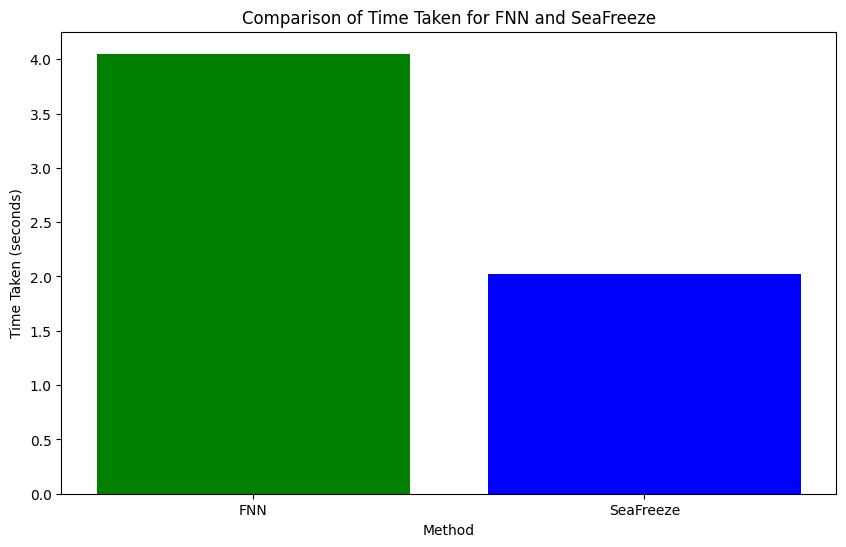

In [68]:
ptm_pt = np.array([[500, 300, 1.0]], dtype=np.float32)

start_time = time.time()
for _ in range(100):
    y_pred_scaled = model.predict(ptm_pt)
end_time = time.time()

# Calculate the time taken
time_taken_model = end_time - start_time
print(f"Time taken to compute the properties using the FNN: {time_taken_model:.4f} seconds")

# SeaFreeze computation
ptm_pt_seafreeze = np.empty((1,), object)
ptm_pt_seafreeze[0] = (500, 300, 1.0)

# Measure the time taken by SeaFreeze
start_time = time.time()
for _ in range(100):
    out = sf.getProp(ptm_pt_seafreeze, 'NaClaq', sf_path, *props)
end_time = time.time()

# Calculate the time taken
time_taken_seafreeze = end_time - start_time
print(f"Time taken to compute the properties using SeaFreeze: {time_taken_seafreeze:.4f} seconds")

labels = ['FNN', 'SeaFreeze']
times = [time_taken_model, time_taken_seafreeze]

plt.figure(figsize=(10, 6))
plt.bar(labels, times, color=['green', 'blue'])
plt.xlabel('Method')
plt.ylabel('Time Taken (seconds)')
plt.title('Comparison of Time Taken for FNN and SeaFreeze')
plt.show()

82/82 ━━━━━━━━━━━━━━━━━━━━ 0s 715us/step


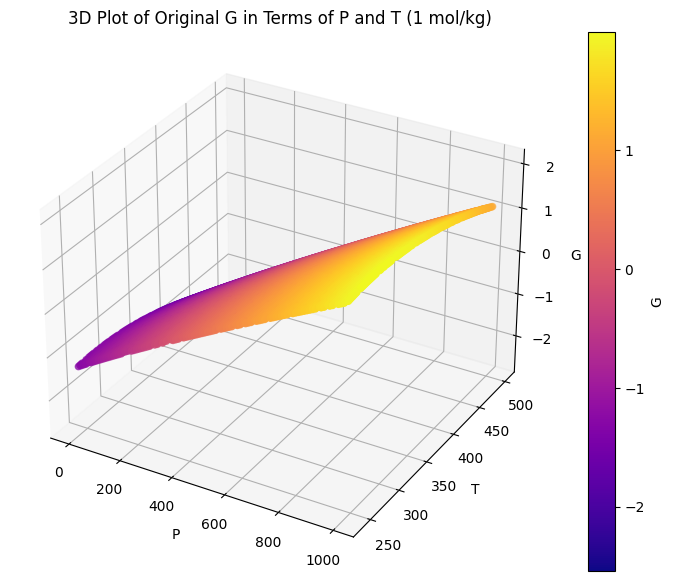

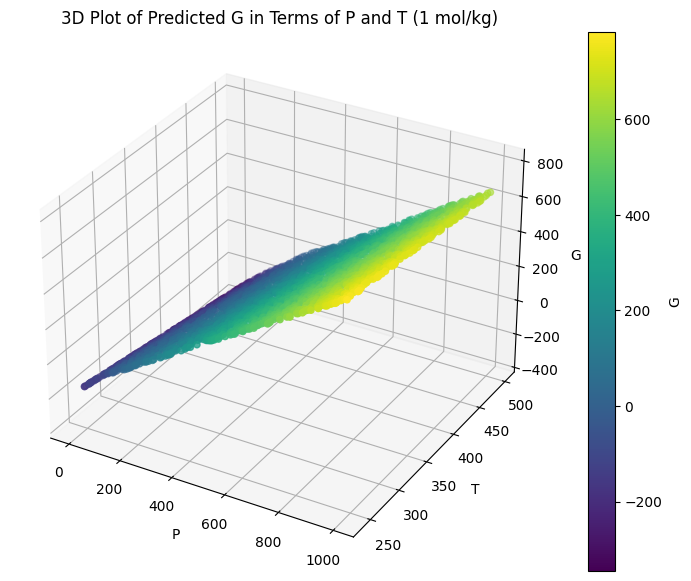

In [69]:
# Filter the training set for a concentration of 1 mol/kg
mask_train = X_train_np[:, 2] == 1.0
X_train_filtered = X_train_np[mask_train]
y_train_filtered = y_train[mask_train]

# Extract the P, T, and M values from the filtered training set
P_train = X_train_filtered[:, 0]
T_train = X_train_filtered[:, 1]

# Undo the normalization for y_train
y_train_original = y_train_filtered

# Extract the G values from the original training data
G_train = y_train_original[:, 0]   

# Filter the test set for a concentration of 1 mol/kg
X_test_np = np.array(X_test)
mask_test = X_test_np[:, 2] == 1.0
X_test_filtered = X_test_np[mask_test]

# Extract the P, T, and M values from the filtered test set
P_test = X_test_filtered[:, 0]
T_test = X_test_filtered[:, 1]

# Make predictions on the filtered test set
y_pred_scaled = model.predict(X_test_filtered)

# Undo the normalization
y_pred = scaler.inverse_transform(y_pred_scaled)

# Extract the G values from the predictions
G_pred = y_pred[:, 0]  

# Create a 3D plot for the original training data
fig1 = plt.figure(figsize=(10, 7))
ax1 = fig1.add_subplot(111, projection='3d')
sc_train = ax1.scatter(P_train, T_train, G_train, c=G_train, cmap='plasma', label='Original G')
cbar1 = plt.colorbar(sc_train)
cbar1.set_label('G')
ax1.set_xlabel('P')
ax1.set_ylabel('T')
ax1.set_zlabel('G')
ax1.set_title('3D Plot of Original G in Terms of P and T (1 mol/kg)')

plt.show()

# Create a 3D plot for the predicted data (G)
fig2 = plt.figure(figsize=(10, 7))
ax2 = fig2.add_subplot(111, projection='3d')
sc_pred = ax2.scatter(P_test, T_test, G_pred, c=G_pred, cmap='viridis', label='Predicted G')
cbar2 = plt.colorbar(sc_pred)
cbar2.set_label('G')
ax2.set_xlabel('P')
ax2.set_ylabel('T')
ax2.set_zlabel('G')
ax2.set_title('3D Plot of Predicted G in Terms of P and T (1 mol/kg)')

plt.show()

## Model Architecture Exploration II
 I want to use a custom loss function informed by the differential thermodynamic relationships between variables; for instance, I want to predict gibbs energy and density based on pressure temperature and concentration, and density is the inverse of the first pressure derivative with respect to gibbs energy.

Model: "functional_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_1 (InputLayer)      │ (None, 3)              │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3 (Dense)                 │ (None, 128)            │           512 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4 (Dense)                 │ (None, 64)             │         8,256 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5 (Dense)                 │ (None, 2)              │           130 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 8,898 (34.76 KB)

 Trainable params: 8,898 (34.76 KB)

 Non-trainable params: 0 (0.00 B)

Epoch 1, Loss: 3031.0810546875, MSE: 1.5578444004058838, Val Loss: 3.9610233306884766, Val MSE: 1.561551570892334, Train R2: [-1.30684793 -0.26254518], Val R2: [-0.95013821 -0.17176835]
Epoch 2, Loss: 3.902052640914917, MSE: 1.688199758529663, Val Loss: 3.858792304992676, Val MSE: 1.8888195753097534, Train R2: [-1.29651397 -0.61254327], Val R2: [-0.9103704  -0.86648298]
Epoch 3, Loss: 3.846723794937134, MSE: 2.092620611190796, Val Loss: 3.837043285369873, Val MSE: 2.1902716159820557, Train R2: [-1.30676463 -0.93522762], Val R2: [-0.92535451 -1.45470581]
Epoch 4, Loss: 3.8402416706085205, MSE: 2.200424909591675, Val Loss: 3.835456609725952, Val MSE: 2.1313583850860596, Train R2: [-1.29951176 -0.72180603], Val R2: [-0.92424218 -1.3379297 ]
Epoch 5, Loss: 3.8394715785980225, MSE: 1.9847321510314941, Val Loss: 3.835263729095459, Val MSE: 1.852021336555481, Train R2: [-1.30622047 -0.50991346], Val R2: [-0.9233769  -0.77982179]
Epoch 6, Loss: 3.839327812194824, MSE: 1.7290772199630737, Val L

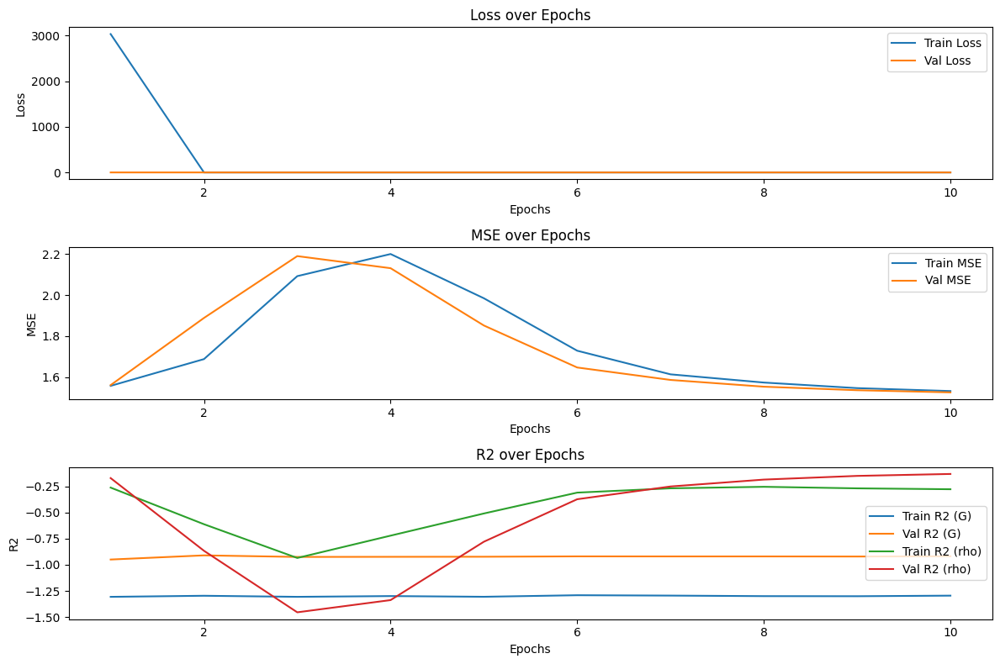

In [42]:
# Extract features and new target variable set
X = data_j[['P_Mpa', 'T_K', 'm_molkg']].values
y = data_j[['G', 'rho']].values  

# Split the data into training and test sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Normalize the features
scaler_X = StandardScaler()
X_train_scaled = scaler_X.fit_transform(X_train).astype(np.float32)
X_test_scaled = scaler_X.transform(X_test).astype(np.float32)

# Normalize the target variables
scaler_y = StandardScaler()
y_train_scaled = scaler_y.fit_transform(y_train).astype(np.float32)
y_test_scaled = scaler_y.transform(y_test).astype(np.float32)

# Define the custom loss function
def custom_loss(y_true, y_pred, P):
    # Extract the true and predicted values for Gibbs energy and density
    G_true, rho_true = y_true[:, 0], y_true[:, 1]
    G_pred, rho_pred = y_pred[:, 0], y_pred[:, 1]
    
    with tf.GradientTape() as tape:
        tape.watch(P)
        G_pred_tensor = G_pred * P  # Ensure G_pred_tensor is a function of P
        dG_dP_pred = tape.gradient(G_pred_tensor, P)
    
    # Calculate the predicted density based on the physical relationship
    rho_pred_physical = 1.0 / dG_dP_pred
    
    # Calculate the mean squared error for Gibbs energy and density
    mse_G = tf.reduce_mean(tf.square(G_true - G_pred))
    mse_rho = tf.reduce_mean(tf.square(rho_true - rho_pred_physical))
    
    # Combine the losses
    total_loss = mse_G + mse_rho
    return total_loss

# Define the model
def build_model():
    inputs = keras.Input(shape=(X_train_scaled.shape[1],))
    x = layers.Dense(128, activation='relu')(inputs)
    x = layers.Dense(64, activation='relu')(x)
    outputs = layers.Dense(2)(x)  # Output layer for Gibbs energy and density
    model = keras.Model(inputs, outputs)
    return model

# Build and summarize the model
model = build_model()
model.summary()

# Define the optimizer and metrics
optimizer = keras.optimizers.Adam()
train_loss = keras.metrics.Mean(name='train_loss')
train_mse = keras.metrics.MeanSquaredError(name='train_mse')
val_loss = keras.metrics.Mean(name='val_loss')
val_mse = keras.metrics.MeanSquaredError(name='val_mse')

# Lists to store metrics
train_losses = []
train_mses = []
val_losses = []
val_mses = []
train_r2s = []
val_r2s = []

# Custom training loop
@tf.function
def train_step(X_batch, y_batch):
    P = tf.convert_to_tensor(X_batch[:, 0], dtype=tf.float32)  # Use batch size
    with tf.GradientTape() as tape:
        y_pred = model(X_batch, training=True)
        loss = custom_loss(y_batch, y_pred, P)
    gradients = tape.gradient(loss, model.trainable_variables)
    optimizer.apply_gradients(zip(gradients, model.trainable_variables))
    
    train_loss(loss)
    train_mse(y_batch, y_pred)
    return y_batch, y_pred

@tf.function
def val_step(X_batch, y_batch):
    P = tf.convert_to_tensor(X_batch[:, 0], dtype=tf.float32)  # Use batch size
    y_pred = model(X_batch, training=False)
    loss = custom_loss(y_batch, y_pred, P)
    
    val_loss(loss)
    val_mse(y_batch, y_pred)
    return y_batch, y_pred

# Training loop
epochs = 10
batch_size = 64
num_batches = int(np.ceil(X_train_scaled.shape[0] / batch_size))

for epoch in range(epochs):
    # Reset the metrics at the start of the next epoch
    train_loss.reset_state()
    train_mse.reset_state()
    val_loss.reset_state()
    val_mse.reset_state()
    
    # Training loop
    for i in range(num_batches):
        start_idx = i * batch_size
        end_idx = (i + 1) * batch_size
        X_batch = X_train_scaled[start_idx:end_idx]
        y_batch = y_train_scaled[start_idx:end_idx]
        y_batch_pred, y_pred = train_step(X_batch, y_batch)
    
    # Validation loop
    y_val_batch_pred, y_val_pred = val_step(X_test_scaled, y_test_scaled)
    
    # Calculate R2 scores
    train_r2 = r2_score(y_batch_pred.numpy(), y_pred.numpy(), multioutput='raw_values')
    val_r2 = r2_score(y_val_batch_pred.numpy(), y_val_pred.numpy(), multioutput='raw_values')
    
    # Store metrics
    train_losses.append(train_loss.result().numpy())
    train_mses.append(train_mse.result().numpy())
    val_losses.append(val_loss.result().numpy())
    val_mses.append(val_mse.result().numpy())
    train_r2s.append(train_r2)
    val_r2s.append(val_r2)
    
    print(f'Epoch {epoch + 1}, '
          f'Loss: {train_loss.result()}, '
          f'MSE: {train_mse.result()}, '
          f'Val Loss: {val_loss.result()}, '
          f'Val MSE: {val_mse.result()}, '
          f'Train R2: {train_r2}, '
          f'Val R2: {val_r2}')

# Evaluate the model on the test set
test_loss, test_mse = val_loss.result(), val_mse.result()
print(f"Test MSE: {test_mse:.4f}")

# Make predictions
y_pred_scaled = model.predict(X_test_scaled, batch_size=1024)  # Set batch size to 1024

# Verify that predictions are generated
print("Predictions:", y_pred_scaled)

# Inverse transform the predictions
y_pred = scaler_y.inverse_transform(y_pred_scaled)
y_test_original = scaler_y.inverse_transform(y_test_scaled)

# Calculate MSE and R2 for each target variable
mse_scores = mean_squared_error(y_test_original, y_pred, multioutput='raw_values')
r2_scores = r2_score(y_test_original, y_pred, multioutput='raw_values')

# Print the metrics
for i, prop in enumerate(['G', 'rho']):
    print(f"{prop} - MSE: {mse_scores[i]:.4f}, R2: {r2_scores[i]:.4f}")

# Plot the metrics
epochs_range = range(1, epochs + 1)

plt.figure(figsize=(12, 8))

# Plot Loss
plt.subplot(3, 1, 1)
plt.plot(epochs_range, train_losses, label='Train Loss')
plt.plot(epochs_range, val_losses, label='Val Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.title('Loss over Epochs')

# Plot MSE
plt.subplot(3, 1, 2)
plt.plot(epochs_range, train_mses, label='Train MSE')
plt.plot(epochs_range, val_mses, label='Val MSE')
plt.xlabel('Epochs')
plt.ylabel('MSE')
plt.legend()
plt.title('MSE over Epochs')

# Plot R2
plt.subplot(3, 1, 3)
train_r2s = np.array(train_r2s)
val_r2s = np.array(val_r2s)
plt.plot(epochs_range, train_r2s[:, 0], label='Train R2 (G)')
plt.plot(epochs_range, val_r2s[:, 0], label='Val R2 (G)')
plt.plot(epochs_range, train_r2s[:, 1], label='Train R2 (rho)')
plt.plot(epochs_range, val_r2s[:, 1], label='Val R2 (rho)')
plt.xlabel('Epochs')
plt.ylabel('R2')
plt.legend()
plt.title('R2 over Epochs')

plt.tight_layout()
plt.show()

Looks bad. Plot surfaces:

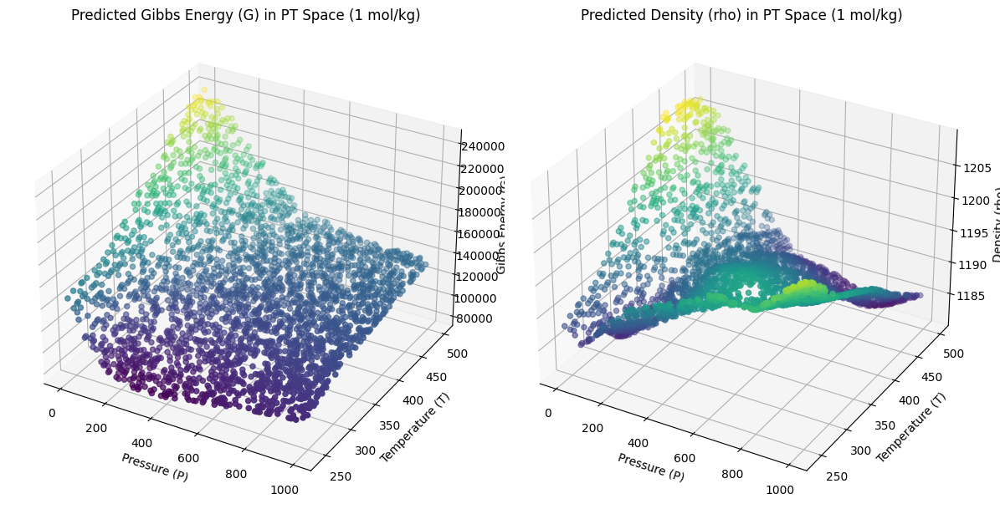

In [37]:
# Filter test data for concentration of one mole per kilogram
one_mole_idx = np.where(X_test[:, 2] == 1.0)[0]
X_test_one_mole = X_test[one_mole_idx]
y_pred_one_mole = y_pred[one_mole_idx]

# Plot predictions in PT space for one mole per kilogram
fig = plt.figure(figsize=(12, 6))

# Plot G predictions in PT space
ax1 = fig.add_subplot(121, projection='3d')
ax1.scatter(X_test_one_mole[:, 0], X_test_one_mole[:, 1], y_pred_one_mole[:, 0], c=y_pred_one_mole[:, 0], cmap='viridis', marker='o')
ax1.set_xlabel('Pressure (P)')
ax1.set_ylabel('Temperature (T)')
ax1.set_zlabel('Gibbs Energy (G)')
ax1.set_title('Predicted Gibbs Energy (G) in PT Space (1 mol/kg)')

# Plot rho predictions in PT space
ax2 = fig.add_subplot(122, projection='3d')
ax2.scatter(X_test_one_mole[:, 0], X_test_one_mole[:, 1], y_pred_one_mole[:, 1], c=y_pred_one_mole[:, 1], cmap='viridis', marker='o')
ax2.set_xlabel('Pressure (P)')
ax2.set_ylabel('Temperature (T)')
ax2.set_zlabel('Density (rho)')
ax2.set_title('Predicted Density (rho) in PT Space (1 mol/kg)')

plt.tight_layout()
plt.show()

I don't even need to plot residuals to tell that failed. It is interesting and discouraging that the R2 values are consistently negative. There is probably an issue with my custom loss function; there was a lot of debugging involved in passing the pressures corresponding to the predictions made on each training data batch to the loss function. The array sizes were incompatible, causing the gradient evaluation to return as None. I had to use copilot to help write a custom training loop to get around it.

I'll try some hyperparameter tuning using the custom loss function, which will hopefully improve the performance.

Trial 82 Complete [00h 01m 38s]
val_mean_squared_error: 1.4887398481369019

Best val_mean_squared_error So Far: 0.5878768563270569
Total elapsed time: 01h 55m 48s
Epoch 1/50
18788/18788 ━━━━━━━━━━━━━━━━━━━━ 10s 488us/step - loss: 5.1379 - mean_squared_error: 1.4242 - val_loss: 3.8487 - val_mean_squared_error: 1.4425
Epoch 2/50
18788/18788 ━━━━━━━━━━━━━━━━━━━━ 9s 494us/step - loss: 3.8396 - mean_squared_error: 1.4382 - val_loss: 3.8484 - val_mean_squared_error: 1.4460
Epoch 3/50
18788/18788 ━━━━━━━━━━━━━━━━━━━━ 10s 549us/step - loss: 3.8327 - mean_squared_error: 1.4432 - val_loss: 3.8483 - val_mean_squared_error: 1.4517
Epoch 4/50
18788/18788 ━━━━━━━━━━━━━━━━━━━━ 9s 467us/step - loss: 3.8343 - mean_squared_error: 1.4473 - val_loss: 3.8483 - val_mean_squared_error: 1.4551
Epoch 5/50
18788/18788 ━━━━━━━━━━━━━━━━━━━━ 9s 470us/step - loss: 3.8401 - mean_squared_error: 1.4516 - val_loss: 3.8483 - val_mean_squared_error: 1.4592
Epoch 6/50
18788/18788 ━━━━━━━━━━━━━━━━━━━━ 9s 477us/step - loss:

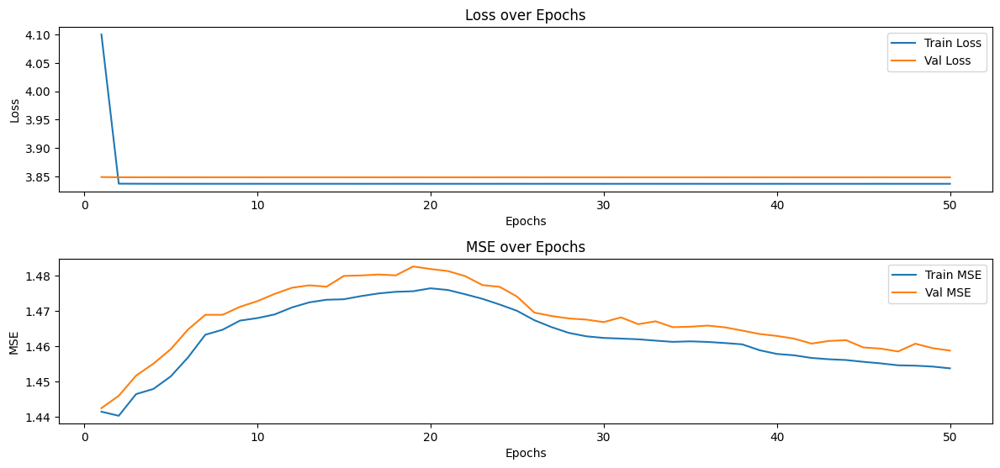

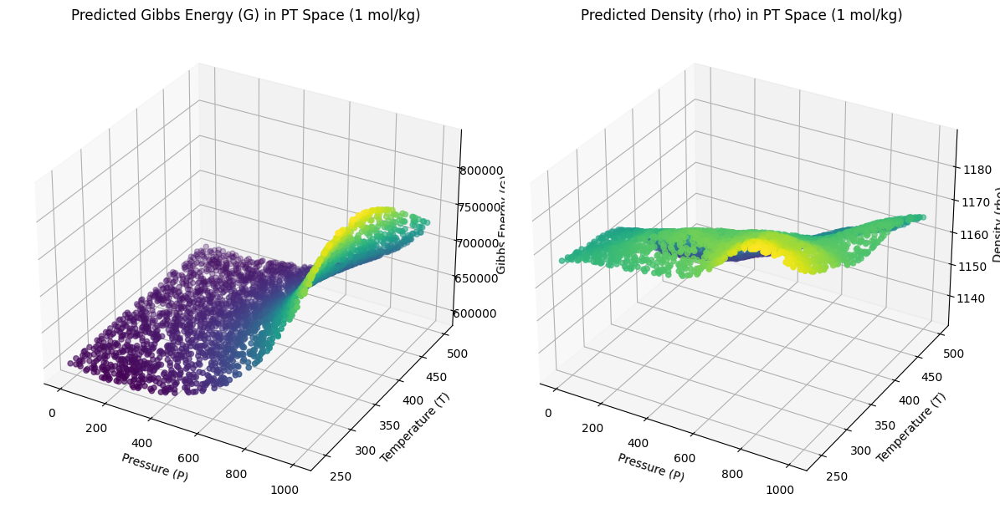

In [43]:
# normalization, test-train split, etc done in previous cells

# Define the custom loss function
def custom_loss(y_true, y_pred):
    # Extract the true and predicted values for Gibbs energy and density
    G_true, rho_true = y_true[:, 0], y_true[:, 1]
    G_pred, rho_pred = y_pred[:, 0], y_pred[:, 1]
    
    # Calculate the first pressure derivative of Gibbs energy (the inverse of this is density)
    P = tf.convert_to_tensor(y_true[:, 0], dtype=tf.float32)  # Use batch size
    
    with tf.GradientTape() as tape:
        tape.watch(P)
        G_pred_tensor = G_pred * P  # Ensure G_pred_tensor is a function of P (debugging)
        dG_dP_pred = tape.gradient(G_pred_tensor, P)
    
    # Calculate the predicted density based on the physical relationship
    rho_pred_physical = 1.0 / dG_dP_pred
    
    # Calculate the mean squared error for Gibbs energy and density
    mse_G = tf.reduce_mean(tf.square(G_true - G_pred))
    mse_rho = tf.reduce_mean(tf.square(rho_true - rho_pred_physical))
    
    # Combine losses
    total_loss = mse_G + mse_rho
    return total_loss

# Define the hypermodel
def build_hypermodel(hp):
    inputs = keras.Input(shape=(X_train_scaled.shape[1],))
    x = layers.Dense(hp.Int('units1', min_value=32, max_value=256, step=32), activation='relu')(inputs)
    x = layers.Dense(hp.Int('units2', min_value=32, max_value=256, step=32), activation='relu')(x)
    outputs = layers.Dense(2)(x)  # Output layer for Gibbs energy and density
    model = keras.Model(inputs, outputs)
    model.compile(optimizer=keras.optimizers.Adam(hp.Choice('learning_rate', values=[1e-2, 1e-3, 1e-4])),
                  loss=custom_loss,
                  metrics=['mean_squared_error'])
    return model

# Initialize the tuner
tuner = kt.Hyperband(build_hypermodel,
                     objective='val_mean_squared_error',
                     max_epochs=50,
                     factor=3,
                     directory='my_dir',
                     project_name='hyperparameter_tuning')

# Define early stopping callback
stop_early = keras.callbacks.EarlyStopping(monitor='val_loss', patience=5)

# Run the hyperparameter search
tuner.search(X_train_scaled, y_train_scaled, epochs=50, validation_split=0.2, callbacks=[stop_early])

# Get the optimal hyperparameters
best_hps = tuner.get_best_hyperparameters(num_trials=1)[0]

# Build the model with the optimal hyperparameters
model = build_hypermodel(best_hps)

# Train the model
history = model.fit(X_train_scaled, y_train_scaled, epochs=50, validation_split=0.2)

# Evaluate the model on the test set
test_loss, test_mse = model.evaluate(X_test_scaled, y_test_scaled)
print(f"Test MSE: {test_mse:.4f}")

# Make predictions
y_pred_scaled = model.predict(X_test_scaled)

# Verify that predictions are generated
print("Predictions:", y_pred_scaled)

# Inverse transform the predictions
y_pred = scaler_y.inverse_transform(y_pred_scaled)
y_test_original = scaler_y.inverse_transform(y_test_scaled)

# Calculate MSE and R2 for each target variable
mse_scores = mean_squared_error(y_test_original, y_pred, multioutput='raw_values')
r2_scores = r2_score(y_test_original, y_pred, multioutput='raw_values')

# Print the metrics
for i, prop in enumerate(['G', 'rho']):
    print(f"{prop} - MSE: {mse_scores[i]:.4f}, R2: {r2_scores[i]:.4f}")

# Plot the metrics
epochs_range = range(1, len(history.history['loss']) + 1)

plt.figure(figsize=(12, 8))

# Plot Loss
plt.subplot(3, 1, 1)
plt.plot(epochs_range, history.history['loss'], label='Train Loss')
plt.plot(epochs_range, history.history['val_loss'], label='Val Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.title('Loss over Epochs')

# Plot MSE
plt.subplot(3, 1, 2)
plt.plot(epochs_range, history.history['mean_squared_error'], label='Train MSE')
plt.plot(epochs_range, history.history['val_mean_squared_error'], label='Val MSE')
plt.xlabel('Epochs')
plt.ylabel('MSE')
plt.legend()
plt.title('MSE over Epochs')

plt.tight_layout()
plt.show()

# Filter test data for concentration of one mole per kilogram
one_mole_idx = np.where(X_test[:, 2] == 1.0)[0]
X_test_one_mole = X_test[one_mole_idx]
y_pred_one_mole = y_pred[one_mole_idx]

# Plot predictions in PT space for one mole per kilogram
fig = plt.figure(figsize=(12, 6))

# Plot G predictions in PT space
ax1 = fig.add_subplot(121, projection='3d')
ax1.scatter(X_test_one_mole[:, 0], X_test_one_mole[:, 1], y_pred_one_mole[:, 0], c=y_pred_one_mole[:, 0], cmap='viridis', marker='o')
ax1.set_xlabel('Pressure (P)')
ax1.set_ylabel('Temperature (T)')
ax1.set_zlabel('Gibbs Energy (G)')
ax1.set_title('Predicted Gibbs Energy (G) in PT Space (1 mol/kg)')

# Plot rho predictions in PT space
ax2 = fig.add_subplot(122, projection='3d')
ax2.scatter(X_test_one_mole[:, 0], X_test_one_mole[:, 1], y_pred_one_mole[:, 1], c=y_pred_one_mole[:, 1], cmap='viridis', marker='o')
ax2.set_xlabel('Pressure (P)')
ax2.set_ylabel('Temperature (T)')
ax2.set_zlabel('Density (rho)')
ax2.set_title('Predicted Density (rho) in PT Space (1 mol/kg)')

plt.tight_layout()
plt.show()

Still looks bad. Plotting residuals:

23485/23485 ━━━━━━━━━━━━━━━━━━━━ 5s 232us/step


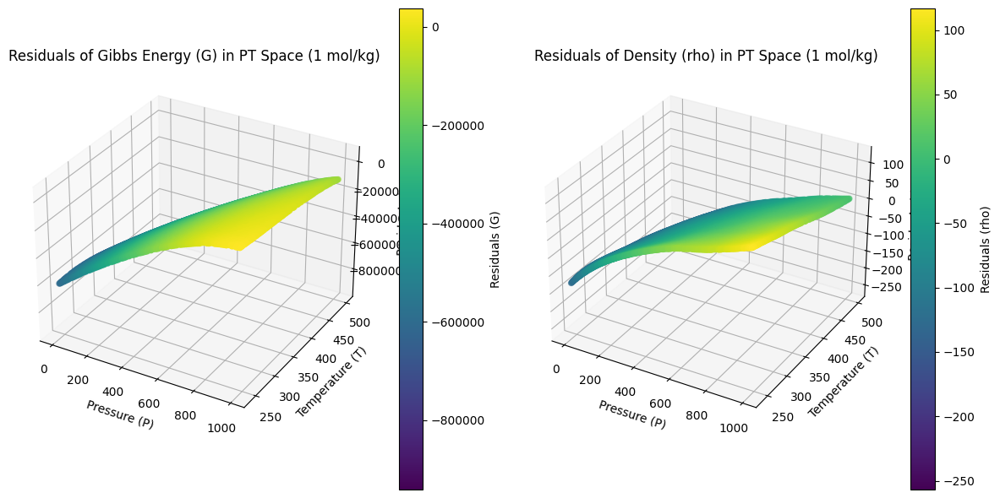

In [45]:
# plot residuals

# Make predictions on the training data
y_train_pred_scaled = model.predict(X_train_scaled)

# Inverse transform the predictions and true values
y_train_pred = scaler_y.inverse_transform(y_train_pred_scaled)
y_train_original = scaler_y.inverse_transform(y_train_scaled)

# Calculate residuals for G and rho
residuals_G = y_train_original[:, 0] - y_train_pred[:, 0]
residuals_rho = y_train_original[:, 1] - y_train_pred[:, 1]

# Filter training data for concentration of one mole per kilogram
one_mole_idx_train = np.where(X_train[:, 2] == 1.0)[0]
X_train_one_mole = X_train[one_mole_idx_train]
residuals_G_one_mole = residuals_G[one_mole_idx_train]
residuals_rho_one_mole = residuals_rho[one_mole_idx_train]

# Plot residuals in PT space for one mole per kilogram
fig = plt.figure(figsize=(12, 6))

# Plot G residuals in PT space
ax1 = fig.add_subplot(121, projection='3d')
sc1 = ax1.scatter(X_train_one_mole[:, 0], X_train_one_mole[:, 1], residuals_G_one_mole, c=residuals_G_one_mole, cmap='viridis', marker='o')
ax1.set_xlabel('Pressure (P)')
ax1.set_ylabel('Temperature (T)')
ax1.set_zlabel('Residuals (G)')
ax1.set_title('Residuals of Gibbs Energy (G) in PT Space (1 mol/kg)')
fig.colorbar(sc1, ax=ax1, label='Residuals (G)')

# Plot rho residuals in PT space
ax2 = fig.add_subplot(122, projection='3d')
sc2 = ax2.scatter(X_train_one_mole[:, 0], X_train_one_mole[:, 1], residuals_rho_one_mole, c=residuals_rho_one_mole, cmap='viridis', marker='o')
ax2.set_xlabel('Pressure (P)')
ax2.set_ylabel('Temperature (T)')
ax2.set_zlabel('Residuals (rho)')
ax2.set_title('Residuals of Density (rho) in PT Space (1 mol/kg)')
fig.colorbar(sc2, ax=ax2, label='Residuals (rho)')

plt.tight_layout()
plt.show()

Too bad -- this was an interesting idea, but didn't pan out. The computational time isn't a reasonable investment either, even if this had worked, and it also very clearly takes a long time to evaluate relative to other approaches. 

Lastly, I'll try a training a recurrent neural network (RNN) .

Features shape: (939401, 3)
Target shape: (939401, 8)
Epoch 1/10


/opt/anaconda3/envs/eos_env/lib/python3.9/site-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


18788/18788 ━━━━━━━━━━━━━━━━━━━━ 53s 3ms/step - loss: 0.1391 - mean_squared_error: 0.1391 - val_loss: 0.0033 - val_mean_squared_error: 0.0033
Epoch 2/10
18788/18788 ━━━━━━━━━━━━━━━━━━━━ 52s 3ms/step - loss: 0.0028 - mean_squared_error: 0.0028 - val_loss: 0.0014 - val_mean_squared_error: 0.0014
Epoch 3/10
18788/18788 ━━━━━━━━━━━━━━━━━━━━ 52s 3ms/step - loss: 0.0014 - mean_squared_error: 0.0014 - val_loss: 9.8917e-04 - val_mean_squared_error: 9.8917e-04
Epoch 4/10
18788/18788 ━━━━━━━━━━━━━━━━━━━━ 49s 3ms/step - loss: 0.0011 - mean_squared_error: 0.0011 - val_loss: 7.3172e-04 - val_mean_squared_error: 7.3172e-04
Epoch 5/10
18788/18788 ━━━━━━━━━━━━━━━━━━━━ 49s 3ms/step - loss: 7.8655e-04 - mean_squared_error: 7.8655e-04 - val_loss: 4.3986e-04 - val_mean_squared_error: 4.3986e-04
Epoch 6/10
18788/18788 ━━━━━━━━━━━━━━━━━━━━ 50s 3ms/step - loss: 6.3306e-04 - mean_squared_error: 6.3306e-04 - val_loss: 3.2945e-04 - val_mean_squared_error: 3.2945e-04
Epoch 7/10
18788/18788 ━━━━━━━━━━━━━━━━━━━━ 5

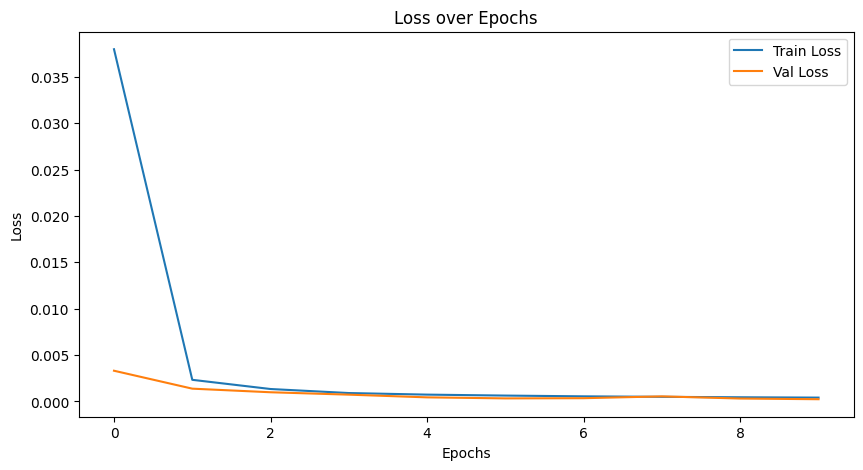

23485/23485 ━━━━━━━━━━━━━━━━━━━━ 21s 874us/step


<Figure size 1800x1200 with 0 Axes>

In [82]:
props = ['G', 'S', 'U', 'H', 'A', 'rho', 'Cp', 'alpha'] #, 'Kt', 'Kp', 'Ks', 'alpha', 'vel', 'mus', 'muw', 'Vm', 'Cpm', 'Cpa', 'Va', 'Vex', 'phi', 'aw', 'gam', 'Gex')

# Extract features and target variables
X = data_j[['P_Mpa', 'T_K', 'm_molkg']].values
y = data_j[props].values

# Check data shapes
print("Features shape:", X.shape)
print("Target shape:", y.shape)

# Split the data into training and test sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Normalize the features
scaler_X = StandardScaler()
X_train_scaled = scaler_X.fit_transform(X_train).astype(np.float32)
X_test_scaled = scaler_X.transform(X_test).astype(np.float32)

# Normalize the target variables
scaler_y = StandardScaler()
y_train_scaled = scaler_y.fit_transform(y_train).astype(np.float32)
y_test_scaled = scaler_y.transform(y_test).astype(np.float32)

# Define the LSTM architecture
def build_lstm(input_shape, output_channels):
    model = keras.Sequential()
    model.add(layers.LSTM(128, activation='relu', input_shape=input_shape, return_sequences=True))
    model.add(layers.LSTM(64, activation='relu'))
    model.add(layers.Dense(output_channels))
    return model

# Build the LSTM model
input_shape = (X_train_scaled.shape[1], 1)
output_channels = len(props)
model = build_lstm(input_shape, output_channels)

# Compile the model with a lower learning rate
model.compile(optimizer=keras.optimizers.Adam(learning_rate=1e-4), loss='mean_squared_error', metrics=['mean_squared_error'])

# Reshape the input data to fit the LSTM model
X_train_scaled = X_train_scaled.reshape(-1, X_train_scaled.shape[1], 1)
X_test_scaled = X_test_scaled.reshape(-1, X_test_scaled.shape[1], 1)

# Define early stopping callback
early_stopping = keras.callbacks.EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True)

# Train the model
history = model.fit(X_train_scaled, y_train_scaled, epochs=10, validation_split=0.2, callbacks=[early_stopping])

# Evaluate the model on the test set
test_loss, test_mse = model.evaluate(X_test_scaled, y_test_scaled)
print(f"Test MSE: {test_mse:.4f}")
# Plot loss over epochs
plt.figure(figsize=(10, 5))
plt.plot(history.history['loss'], label='Train Loss')
plt.plot(history.history['val_loss'], label='Val Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.title('Loss over Epochs')
plt.show()

# Make predictions on the training data
y_train_pred_scaled = model.predict(X_train_scaled)

# Inverse transform the predictions and true values
y_train_pred = scaler_y.inverse_transform(y_train_pred_scaled)
y_train_original = scaler_y.inverse_transform(y_train_scaled)

# Calculate residuals for each property
residuals = y_train_original - y_train_pred

# Filter training data for concentration of one mole per kilogram
one_mole_idx_train = np.where(X_train[:, 2] == 1.0)[0]
X_train_one_mole = X_train[one_mole_idx_train]
residuals_one_mole = residuals[one_mole_idx_train]

# Plot residuals in PT space for one mole per kilogram
fig = plt.figure(figsize=(18, 12))


5872/5872 ━━━━━━━━━━━━━━━━━━━━ 5s 894us/step
  Property           MSE        R²
0        G  4.397580e+06  0.999935
1        S  1.096029e+01  0.999979
2        U  1.397349e+06  0.999977
3        H  6.456996e+06  0.999939
4        A  7.216113e+05  0.999932
5      rho  2.987786e-01  0.999967
6       Cp  3.874269e+01  0.999382
7    alpha  1.466125e-11  0.998839


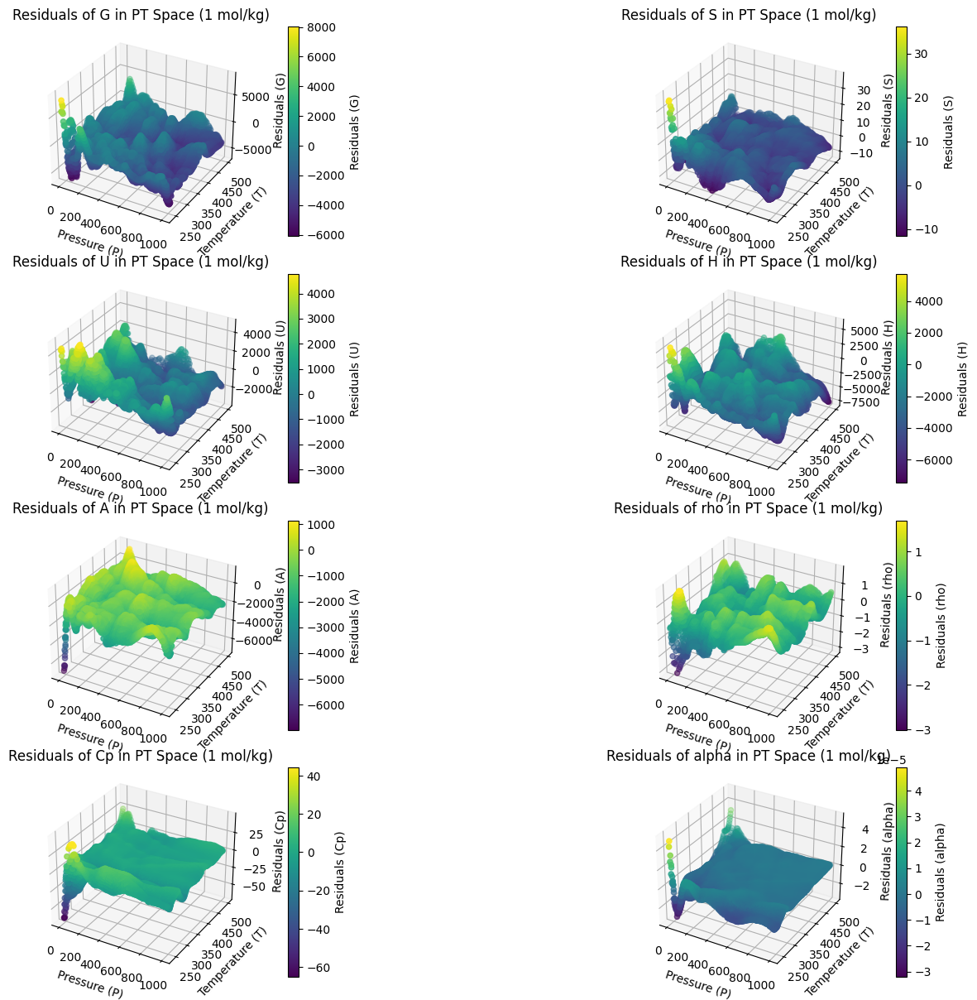

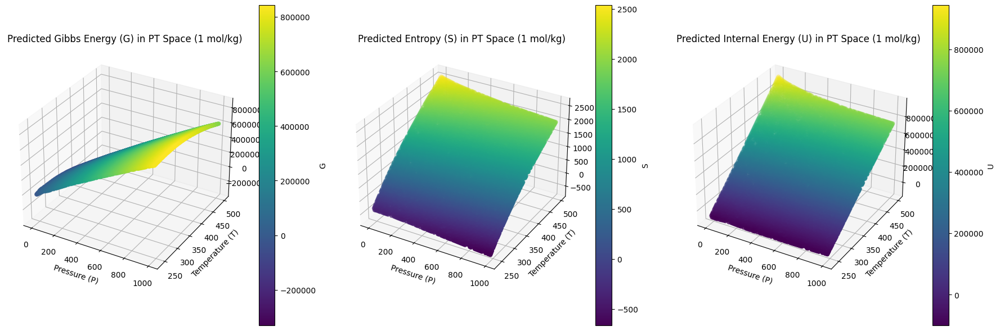

In [85]:
# Make predictions on the test data
y_test_pred_scaled = model.predict(X_test_scaled)

# Inverse transform the predictions and true values
y_test_pred = scaler_y.inverse_transform(y_test_pred_scaled)
y_test_original = scaler_y.inverse_transform(y_test_scaled)

# Calculate MSE and R² for each target variable
mse_scores = mean_squared_error(y_test_original, y_test_pred, multioutput='raw_values')
r2_scores = r2_score(y_test_original, y_test_pred, multioutput='raw_values')

# Create a DataFrame to display the results
results_df = pd.DataFrame({
    'Property': props,
    'MSE': mse_scores,
    'R²': r2_scores
})

print(results_df)

# Plot residuals in PT space for one mole per kilogram
fig = plt.figure(figsize=(18, 12))

# Plot residuals for each property in PT space
for i, prop in enumerate(props):
    ax = fig.add_subplot(4, 2, i+1, projection='3d')
    sc = ax.scatter(X_train_one_mole[:, 0], X_train_one_mole[:, 1], residuals_one_mole[:, i], c=residuals_one_mole[:, i], cmap='viridis', marker='o')
    ax.set_xlabel('Pressure (P)')
    ax.set_ylabel('Temperature (T)')
    ax.set_zlabel(f'Residuals ({prop})')
    ax.set_title(f'Residuals of {prop} in PT Space (1 mol/kg)')
    fig.colorbar(sc, ax=ax, label=f'Residuals ({prop})')

plt.tight_layout()
plt.show()

# Plot predictions for the first three target variables in PT space for one mole per kilogram
fig = plt.figure(figsize=(18, 6))

# Plot G predictions in PT space
ax1 = fig.add_subplot(131, projection='3d')
sc1 = ax1.scatter(X_train_one_mole[:, 0], X_train_one_mole[:, 1], y_train_pred_one_mole[:, 0], c=y_train_pred_one_mole[:, 0], cmap='viridis', marker='o')
ax1.set_xlabel('Pressure (P)')
ax1.set_ylabel('Temperature (T)')
ax1.set_zlabel('G')
ax1.set_title('Predicted Gibbs Energy (G) in PT Space (1 mol/kg)')
fig.colorbar(sc1, ax=ax1, label='G')

# Plot S predictions in PT space
ax2 = fig.add_subplot(132, projection='3d')
sc2 = ax2.scatter(X_train_one_mole[:, 0], X_train_one_mole[:, 1], y_train_pred_one_mole[:, 1], c=y_train_pred_one_mole[:, 1], cmap='viridis', marker='o')
ax2.set_xlabel('Pressure (P)')
ax2.set_ylabel('Temperature (T)')
ax2.set_zlabel('S')
ax2.set_title('Predicted Entropy (S) in PT Space (1 mol/kg)')
fig.colorbar(sc2, ax=ax2, label='S')

# Plot U predictions in PT space
ax3 = fig.add_subplot(133, projection='3d')
sc3 = ax3.scatter(X_train_one_mole[:, 0], X_train_one_mole[:, 1], y_train_pred_one_mole[:, 2], c=y_train_pred_one_mole[:, 2], cmap='viridis', marker='o')
ax3.set_xlabel('Pressure (P)')
ax3.set_ylabel('Temperature (T)')
ax3.set_zlabel('U')
ax3.set_title('Predicted Internal Energy (U) in PT Space (1 mol/kg)')
fig.colorbar(sc3, ax=ax3, label='U')

plt.tight_layout()
plt.show()

The MSEs look awful for A, H, U, and G, so I am going to try to make one more LSTM model with hyperparameter tuning to try to improve.



Features shape: (939401, 3)
Target shape: (939401, 8)
Reloading Tuner from my_dir/hyperparameter_tuning/tuner0.json
Epoch 1/20


/opt/anaconda3/envs/eos_env/lib/python3.9/site-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


18788/18788 ━━━━━━━━━━━━━━━━━━━━ 962s 51ms/step - loss: 0.1637 - mean_squared_error: 0.1637 - val_loss: 0.0051 - val_mean_squared_error: 0.0051
Epoch 2/20
18788/18788 ━━━━━━━━━━━━━━━━━━━━ 123s 7ms/step - loss: 0.0041 - mean_squared_error: 0.0041 - val_loss: 0.0019 - val_mean_squared_error: 0.0019
Epoch 3/20
18788/18788 ━━━━━━━━━━━━━━━━━━━━ 36s 2ms/step - loss: 0.0018 - mean_squared_error: 0.0018 - val_loss: 0.0015 - val_mean_squared_error: 0.0015
Epoch 4/20
18788/18788 ━━━━━━━━━━━━━━━━━━━━ 35s 2ms/step - loss: 0.0013 - mean_squared_error: 0.0013 - val_loss: 0.0021 - val_mean_squared_error: 0.0021
Epoch 5/20
18788/18788 ━━━━━━━━━━━━━━━━━━━━ 35s 2ms/step - loss: 9.5204e-04 - mean_squared_error: 9.5204e-04 - val_loss: 0.0015 - val_mean_squared_error: 0.0015
Epoch 6/20
18788/18788 ━━━━━━━━━━━━━━━━━━━━ 33s 2ms/step - loss: 7.5013e-04 - mean_squared_error: 7.5013e-04 - val_loss: 4.6315e-04 - val_mean_squared_error: 4.6315e-04
Epoch 7/20
18788/18788 ━━━━━━━━━━━━━━━━━━━━ 34s 2ms/step - loss: 6

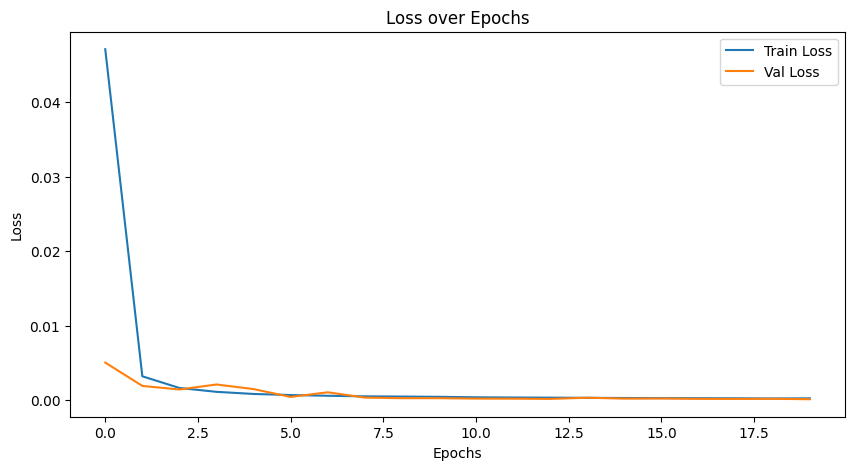

5872/5872 ━━━━━━━━━━━━━━━━━━━━ 4s 694us/step
  Property           MSE        R²
0        G  8.672454e+05  0.999987
1        S  8.696918e+00  0.999983
2        U  2.067319e+06  0.999965
3        H  2.838477e+06  0.999973
4        A  6.270126e+05  0.999941
5      rho  2.096504e-01  0.999977
6       Cp  3.302534e+01  0.999473
7    alpha  8.085302e-12  0.999360


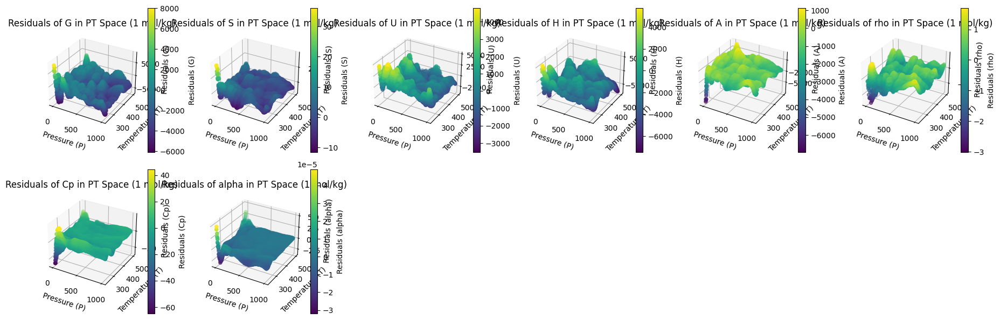

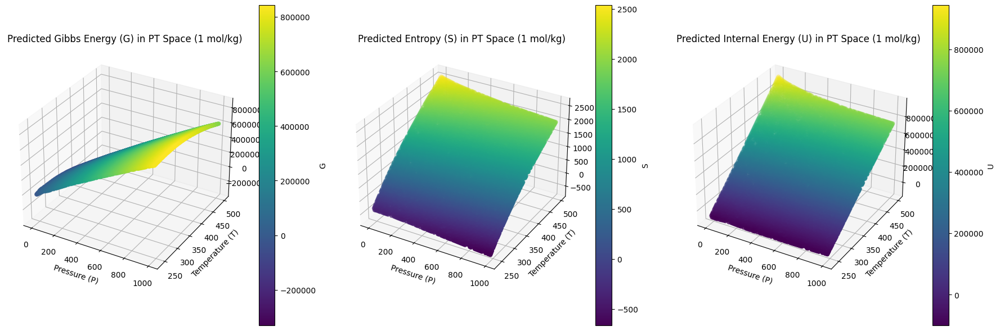

In [87]:
# Define the hypermodel
def build_hypermodel(hp):
    model = keras.Sequential()
    model.add(layers.LSTM(units=hp.Int('units1', min_value=32, max_value=256, step=32), activation='relu', input_shape=(X_train_scaled.shape[1], 1), return_sequences=True))
    model.add(layers.LSTM(units=hp.Int('units2', min_value=32, max_value=256, step=32), activation='relu'))
    model.add(layers.Dense(len(props)))
    model.compile(optimizer=keras.optimizers.Adam(hp.Choice('learning_rate', values=[1e-2, 1e-3, 1e-4])), loss='mean_squared_error', metrics=['mean_squared_error'])
    return model

# Initialize the tuner
tuner = kt.Hyperband(build_hypermodel, objective='val_mean_squared_error', max_epochs=20, factor=3, directory='my_dir', project_name='hyperparameter_tuning')

# Define early stopping callback
stop_early = keras.callbacks.EarlyStopping(monitor='val_loss', patience=5)

# Run the hyperparameter search
tuner.search(X_train_scaled.reshape(-1, X_train_scaled.shape[1], 1), y_train_scaled, epochs=20, validation_split=0.2, callbacks=[stop_early])

# Get the optimal hyperparameters
best_hps = tuner.get_best_hyperparameters(num_trials=1)[0]

# Build the model with the optimal hyperparameters
model = build_hypermodel(best_hps)

# Train the model
history = model.fit(X_train_scaled.reshape(-1, X_train_scaled.shape[1], 1), y_train_scaled, epochs=20, validation_split=0.2, callbacks=[early_stopping])

# Evaluate the model on the test set
test_loss, test_mse = model.evaluate(X_test_scaled.reshape(-1, X_test_scaled.shape[1], 1), y_test_scaled)
print(f"Test MSE: {test_mse:.4f}")

# Plot loss over epochs
plt.figure(figsize=(10, 5))
plt.plot(history.history['loss'], label='Train Loss')
plt.plot(history.history['val_loss'], label='Val Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.title('Loss over Epochs')
plt.show()

# Make predictions on the test data
y_test_pred_scaled = model.predict(X_test_scaled.reshape(-1, X_test_scaled.shape[1], 1))

# Inverse transform the predictions and true values
y_test_pred = scaler_y.inverse_transform(y_test_pred_scaled)
y_test_original = scaler_y.inverse_transform(y_test_scaled)

# Calculate MSE and R² for each target variable
mse_scores = mean_squared_error(y_test_original, y_test_pred, multioutput='raw_values')
r2_scores = r2_score(y_test_original, y_test_pred, multioutput='raw_values')

# Create a DataFrame to display the results
results_df = pd.DataFrame({
    'Property': props,
    'MSE': mse_scores,
    'R²': r2_scores
})

print(results_df)

# Plot residuals in PT space for one mole per kilogram
fig = plt.figure(figsize=(18, 12))

# Plot residuals for each property in PT space
for i, prop in enumerate(props):
    ax = fig.add_subplot(4, 6, i+1, projection='3d')
    sc = ax.scatter(X_train_one_mole[:, 0], X_train_one_mole[:, 1], residuals_one_mole[:, i], c=residuals_one_mole[:, i], cmap='viridis', marker='o')
    ax.set_xlabel('Pressure (P)')
    ax.set_ylabel('Temperature (T)')
    ax.set_zlabel(f'Residuals ({prop})')
    ax.set_title(f'Residuals of {prop} in PT Space (1 mol/kg)')
    fig.colorbar(sc, ax=ax, label=f'Residuals ({prop})')

plt.tight_layout()
plt.show()

# Plot predictions for the first three target variables in PT space for one mole per kilogram
fig = plt.figure(figsize=(18, 6))

# Plot G predictions in PT space
ax1 = fig.add_subplot(131, projection='3d')
sc1 = ax1.scatter(X_train_one_mole[:, 0], X_train_one_mole[:, 1], y_train_pred_one_mole[:, 0], c=y_train_pred_one_mole[:, 0], cmap='viridis', marker='o')
ax1.set_xlabel('Pressure (P)')
ax1.set_ylabel('Temperature (T)')
ax1.set_zlabel('G')
ax1.set_title('Predicted Gibbs Energy (G) in PT Space (1 mol/kg)')
fig.colorbar(sc1, ax=ax1, label='G')

# Plot S predictions in PT space
ax2 = fig.add_subplot(132, projection='3d')
sc2 = ax2.scatter(X_train_one_mole[:, 0], X_train_one_mole[:, 1], y_train_pred_one_mole[:, 1], c=y_train_pred_one_mole[:, 1], cmap='viridis', marker='o')
ax2.set_xlabel('Pressure (P)')
ax2.set_ylabel('Temperature (T)')
ax2.set_zlabel('S')
ax2.set_title('Predicted Entropy (S) in PT Space (1 mol/kg)')
fig.colorbar(sc2, ax=ax2, label='S')

# Plot U predictions in PT space
ax3 = fig.add_subplot(133, projection='3d')
sc3 = ax3.scatter(X_train_one_mole[:, 0], X_train_one_mole[:, 1], y_train_pred_one_mole[:, 2], c=y_train_pred_one_mole[:, 2], cmap='viridis', marker='o')
ax3.set_xlabel('Pressure (P)')
ax3.set_ylabel('Temperature (T)')
ax3.set_zlabel('U')
ax3.set_title('Predicted Internal Energy (U) in PT Space (1 mol/kg)')
fig.colorbar(sc3, ax=ax3, label='U')

plt.tight_layout()
plt.show()

There were small improvements across the board, especially for entropy. Still, I definitely wouldn't use this approach to try to calculate reliable values.

### Performance Evaluation
See above for performance evaluation metrics and visualizations 

### Discussion on Narrow vs. General AI
Narrow AI performs more than adequately for this application; in fact, CML was best by far, so I think this project is an example of a scenario in which less is more in terms of model complexity. I suppose general/ strong ML would have the ability to not only rapidly and accurately reproduce existing equation of state results but to understand and apply underlying thermodynamic principles; maybe it would be able to develop new hybrid equations of state from scratch if it were capable of reading the literature to understand theoretical constraints at extreme conditions and consolidate existing experimental measurements. 

### Overfitting vs underfitting
Surprisingly, many of my attempts at DL appeared underfit to the extent of not being useful. The CML models seemed to provide a good balance, as they performed well both on training data and unseen testing data. I didn't come across any scenarios in which models performed well on training but not test data (none of the learning curves showed large gaps between training and test data), so I didn't have any significant issues with overfitting. 

### Ethical Considerations 
See above for documentation of computational costs.

Our EoS software is open source, and if I train a more computationally efficient CML model on a future EoS (such as the one I plan to generate for ice VII) for publication, I will be sure the model predictions remain transparent via releasing open source code on GitHub.